In [1]:
import sys, os
sys.path.append('..')
sys.path.append('.')

import yaml
import cdpam

from absl import logging
import IPython
import matplotlib.pyplot as plt
import numpy as np
import scipy.io
import tensorflow as tf
import ddsp.colab.colab_utils
from ddsp.spectral_ops import compute_mel, compute_logmel
import ddsp.training
import gin
import gin.tf
import gin.tf.external_configurables

#import wandb
#resume = False
#wandb_id = 'placeholder'
logging.set_verbosity(logging.INFO)

gin.external_configurable(tf.keras.regularizers.L1, module='tf.keras.regularizers')

# Imports for regnet
# import math
# import os
# import random
# import shutil
# import time

# import torch
# from torch import nn
# from torch.utils.data import DataLoader
# from Recorder import Recorder
# from data_utils import RegnetLoader, get_TSN_Data_set
# from criterion import RegnetLoss
# from model import Regnet, Modal_Response_Net
# # from test import test_checkpoint
# from contextlib import redirect_stdout
# from config import _C as config
# import matplotlib
# matplotlib.use('Agg')
# import matplotlib.pyplot as plt
# from tqdm import tqdm

/juno/u/jyau/anaconda3/envs/diffimpactenv/lib/python3.8/site-packages/google/colab/data_table.py:30: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  from IPython.utils import traitlets as _traitlets


tensorflow.python.keras.regularizers.L1

In [2]:
plt.rcParams['font.sans-serif'] = "Arial"
plt.rcParams['font.family'] = "sans-serif"
font_size = 20
plt.rcParams['font.size'] = font_size

fig_width = 6
fig_height = 4
def plot_spec(audio, size, vmin=-5,
             vmax=1,
             rotate=True, **matshow_kwargs):
    print('audio shape: ', audio.shape)
    if len(audio.shape) == 2:
        audio = audio[0]
    logmag = ddsp.spectral_ops.compute_logmag(ddsp.core.tf_float32(audio), size=size)
    #print(np.max(logmag))
    f, t, Zxx = scipy.signal.stft(audio, train_sample_rate, nperseg=size, noverlap=int(0.75*size))
    # logmag = spectral_ops.compute_logmel(core.tf_float32(audio), lo_hz=8.0, bins=80, fft_size=size)
    # logmag = spectral_ops.compute_mfcc(core.tf_float32(audio), mfcc_bins=40, fft_size=size)
    if rotate:
        # logmag = np.rot90(np.log(np.abs(Zxx)))
        logmag = np.rot90(logmag)
    # Plotting.
    logmag = logmag[60:, :]
    plt.matshow(logmag,
              vmin=vmin,
              vmax=vmax,
              cmap=plt.cm.magma,
              aspect='auto',
              **matshow_kwargs)
    
    print(f.shape)
    
    skip_num = 20
    print(logmag.shape)
    plt.yticks(ticks=list((range(logmag.shape[0], 0, -skip_num))).reverse())
    tick_locs = np.arange(logmag.shape[0]-1, 0, -skip_num)
    ticks = np.arange(0, logmag.shape[0]-1, skip_num)
    print(ticks)
    print(f[ticks])
    t = np.arange(test_samples) / train_sample_rate
    plt.yticks(tick_locs, f[ticks].astype(np.int32))
    xtick_nums = np.arange(0, example_secs, 0.1)
    # xtick_locs = np.arange(0, logmag.shape[1], int(skip_num*1.5))
    #xtick_locs = (xtick_nums / example_secs * logmag.shape[1]).astype(np.int32)
    #xtick_nums = xtick_locs / logmag.shape[1] * example_secs
    #plt.xticks(xtick_locs, ['%0.2f'%d for d in xtick_nums])
    plt.tick_params(axis="x", bottom=True, top=False, labelbottom=True, labeltop=False)
    # plt.yticks([])
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    fig = plt.gcf()
    fig.set_size_inches(fig_width, fig_height)

In [3]:
# Eval with saved tensors
def generate_audio_testing(raw_gain, raw_freq, raw_dampings, modal_fir, reverb, impulse_profile,
                           gains, frequencies, dampings, modal_response,
                           noise, acceleration_scale, revc, audio_sample_rate, example_secs, scratch='controls'):
    """Generate DiffImpact's estimate of impact sound based on current model variables."""
    # Generate impulse --> impact profile
    # magnitude_envelopes, taus, prediction['stdevs']
#     impc = impact.get_controls(mags, stdevs, taus, 0) # needs to be 2D?
#     impulse_profile = impact.get_signal(impc['magnitudes'], impc['taus'])
    print("impulse profile shape: ", impulse_profile.shape) # force profile
    zero_freq = np.zeros_like(raw_freq)
    zero_gain = np.random.rand(1,256) #np.zeros_like(raw_gain)
    zero_damp = np.zeros_like(raw_dampings)
    
#     vid = 'ASMR_Addictive_Tapping_1_Hr_No_Talking-glass-bowl-10-of-47'
#     raw_gain = np.load(os.path.join(freq_path, vid+"_gains_raw.npy"))
#     raw_freq = np.load(os.path.join(freq_path, vid+"_freqs_raw.npy"))
#     raw_dampings = np.load(os.path.join(freq_path, vid+"_dampings_raw.npy"))
    
    # Get modal response from raw freqs, gains, and dampings
    irc_scratch = modal_fir.get_controls(raw_gain, raw_freq, raw_dampings)
    ir_scratch = modal_fir.get_signal(irc_scratch['gains'], irc_scratch['frequencies'], irc_scratch['dampings'])
    
    # Get modal response from scaled (passed through get_controls) freqs, gains, dampings
    ir = modal_fir.get_signal(gains, frequencies, dampings)
    
    print("ir: ", ir)
    print("model's output modal response: ", modal_response)
    #print("ir_scratch: ", ir_scratch)
    # Convolve together for modal vibration sounds
    if scratch == 'raw':
        audio = ddsp.core.fft_convolve(impulse_profile, ir_scratch)
    elif scratch == 'controls' or scratch =='control':
        audio = ddsp.core.fft_convolve(impulse_profile, ir)
    else:
        audio = ddsp.core.fft_convolve(impulse_profile, modal_response)
    print("convolved shape: ", audio.shape)
    
    # Generate and add time constant noise
    # Note that in the context, clips.shape[0] is batch size (which is 1 for all testing here)
    # clips.shape[1] is the actual clip size (like 441000 for 10 seconds of 44100 audio sampling rate)
    #unfiltered_noise = tf.random.uniform((clips.shape[0], int(clips.shape[1] * sample_factor)),
    #minval=-1.0, maxval=1.0)
    #noise = ddsp.core.frequency_filter(unfiltered_noise, ddsp.core.exp_sigmoid(noise_magnitudes - 4.0), 257)
    audio += noise
    print("after adding noise: ", audio.shape)
    
    # Add acceleration sound
    audio += impulse_profile * acceleration_scale
    print("after acceleration sound: ", audio.shape)
    
    # Add reverb
#     revc = reverb.get_controls(audio, reverb_gains, reverb_decay)
    audio = reverb.get_signal(audio, revc)#revc['ir'])
    print("after reverb: ", audio.shape)
    
    # Downsample from internal sampling rate to original recording sampling rate
    # audio = ddsp.core.resample(audio, clips.shape[1], 'linear')
    # Note that the resample function will return shape [n_timesteps], which is the second parameter
    print("audio sample rate: ", audio_sample_rate)
    audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
    return audio

In [4]:
# Use this method!!!!!
def generate_audio(predictions, modal_fir, reverb, impact, impulse_profile, gains, frequencies, dampings, modal_response,
                   noise, acceleration_scale, revc, audio_sample_rate, example_secs, output_dir, scratch='controls',
                   modal_fir_only=False):
    """Generate DiffImpact's estimate of impact sound based on current model variables."""
    # Generate impulse --> impact profile
    # magnitude_envelopes, taus, prediction['stdevs']
#     impc = impact.get_controls(mags, stdevs, taus, 0) # needs to be 2D
#     print("tau_bias: ", predictions['tau_bias'])
    impc = impact.get_controls(predictions['magnitudes'], predictions['stdevs'], predictions['taus'], 0)#predictions['tau_bias'])
    impulse_profile_scratch = impact.get_signal(impc['magnitudes'], impc['taus'])
    
    # Check that the impulse profile generated is same as model output
    check = tf.math.equal(impulse_profile, impulse_profile_scratch)
    print(f"compared elements of modal response: {check}")
    if (not tf.reduce_all(check) == True):
        diff = impulse_profile - impulse_profile_scratch
        print("average difference: ", tf.math.reduce_mean(diff))
        print("original impulse profile: ", impulse_profile)
#     assert(tf.reduce_all(check) == True)
    print(f"element-wise comparison of network output impulse profile and from scratch: {tf.reduce_all(check)}")
    print("impulse profile shape: ", impulse_profile_scratch.shape) # force profile
    
    # Generate modal FIR --> modal response (object material sound)
    # TODO: To use "raw" normally again, make sure to switch this!!
    irc_scratch = modal_fir.get_controls(predictions['gains'], predictions['frequencies'], predictions['dampings'])
    ir_scratch = modal_fir.get_signal(irc_scratch['gains'], irc_scratch['frequencies'], irc_scratch['dampings'])
    #ir = modal_fir.get_signal(irc['gains'], irc['frequencies'], irc['dampings'])# Modal response
    ir = modal_fir.get_signal(gains, frequencies, dampings)
    
    # Plotting the network output modal response
    print("Plotting convolve generated modal response")
#     output_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/multiclass-1hr/modal_fir'
    os.makedirs(output_dir, exist_ok=True)
    begin_offset = int(train_sample_rate * 1.95)
    cutoff = int(train_sample_rate * 2.5)

    ir_plot = np.squeeze(ir_scratch) # modal response
    print(ir_plot.shape)
    ir_plot = ir_plot[begin_offset:cutoff]
    t2 = (np.arange(0, ir_plot.shape[0])  - (train_sample_rate * 2 - begin_offset)) / (2 * train_sample_rate)
    plt.plot(t2, ir_plot)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    fig = plt.gcf()
    fig.set_size_inches(fig_width+2, fig_height)
    if no_axis:
        ax = plt.gca()
        # ax.axes.yaxis.set_visible(False)
#         ax.axes.yaxis.set_ticks([])
        plt.xticks(fontsize=font_size-6)
    fig.savefig(os.path.join(output_dir, audio_title+f'_convolve_ir-material_id_{material_id}.png'), bbox_inches='tight')
    plt.show()

    print("model's output modal response: ", modal_response)
    print("ir_scratch: ", ir_scratch)
    print("ir: ", ir)
    
    check = tf.math.equal(modal_response, ir_scratch)
    print(f"compared elements of modal response: {check}")
    assert(tf.reduce_all(check) == True)
    print(f"element-wise comparison of network output modal response and from scratch: {tf.reduce_all(check)}")
    
    # Convolve together for modal vibration sounds
    if scratch == 'raw':
        audio = ddsp.core.fft_convolve(impulse_profile_scratch, ir_scratch)
    elif scratch == 'controls':
        audio = ddsp.core.fft_convolve(impulse_profile_scratch, ir)
    else:
        audio = ddsp.core.fft_convolve(impulse_profile_scratch, modal_response)
    print("convolved shape: ", audio.shape)
    
    if modal_fir_only:
        print("Return audio without adding noise, acceleration sound, or reverb")
        audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
        return audio
    
    # Generate and add time constant noise
    # Note that in the context, clips.shape[0] is batch size (which is 1 for all testing here)
    # clips.shape[1] is the actual clip size (like 441000 for 10 seconds of 44100 audio sampling rate)
    #unfiltered_noise = tf.random.uniform((clips.shape[0], int(clips.shape[1] * sample_factor)), minval=-1.0, maxval=1.0)
    #noise = ddsp.core.frequency_filter(unfiltered_noise, ddsp.core.exp_sigmoid(noise_magnitudes - 4.0), 257)
    audio += noise
    print("after adding noise: ", audio.shape)
    
    # Add acceleration sound
    audio += impulse_profile * acceleration_scale
    print("after acceleration sound: ", audio.shape)
    
    # Add reverb
#     revc = reverb.get_controls(audio, reverb_gains, reverb_decay)
    audio = reverb.get_signal(audio, revc)#revc['ir'])
    print("after reverb: ", audio.shape)
    
    # Downsample from internal sampling rate to original recording sampling rate
    # audio = ddsp.core.resample(audio, clips.shape[1], 'linear')
    # Note that the resample function will return shape [n_timesteps], which is the second parameter
    print("audio sample rate: ", audio_sample_rate)
    audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
    return audio

In [5]:
# Load in impact profile predictions
def generate_audio_impact(predictions, modal_fir, reverb, impact, mags, taus, stdevs,
                   noise, acceleration_scale, revc, audio_sample_rate, example_secs, output_dir, scratch='controls',
                   modal_fir_only=False):
    """Generate DiffImpact's estimate of impact sound based on current model variables."""
    # Generate impulse --> impact profile
    # magnitude_envelopes, taus, prediction['stdevs']
#     impc = impact.get_controls(mags, stdevs, taus, 0) # needs to be 2D
#     print("tau_bias: ", predictions['tau_bias'])
    impc_gt = impact.get_controls(predictions['magnitudes'], predictions['stdevs'], predictions['taus'], 0)#predictions['tau_bias'])
    impulse_profile_gt = impact.get_signal(impc_gt['magnitudes'], impc_gt['taus'])
    
#     mags = tf.zeros([1, 2520,1]) # test passing in all zeros for mags
#     taus = tf.zeros([1, 2520, 1])
    
    impc = impact.get_controls(mags, stdevs, taus, 0)#predictions['tau_bias'])
    impulse_profile_pred = impact.get_signal(impc['magnitudes'], impc['taus'])
    
    print("GT impact shape: ", impulse_profile_gt.shape)
    print("pred impact shape: ", impulse_profile_pred.shape)
    
    print("model's impact profile (has some noise) num nonzeros: ", tf.math.count_nonzero(tf.math.round(predictions['impact']['signal'])))
    print("Generated impact profile from model's output num nonzero: ", tf.math.count_nonzero(tf.math.round(impulse_profile_gt)))
    print("Predicted impact profile from loading num nonzero: ", tf.math.count_nonzero(tf.math.round(impulse_profile_pred)))
    print("difference avg: ", tf.math.reduce_mean(impulse_profile_gt - impulse_profile_pred))
    
    # Check that the impulse profile generated is same as model output
#     check = tf.math.equal(impulse_profile, impulse_profile_scratch)
#     print(f"compared elements of impulse profile: {check}")
#     if (not tf.reduce_all(check) == True):
#         diff = impulse_profile - impulse_profile_scratch
#         print("average difference: ", tf.math.reduce_mean(diff))
#         print("original impulse profile: ", impulse_profile)
# #     assert(tf.reduce_all(check) == True)
#     print(f"element-wise comparison of network output impulse profile and from scratch: {tf.reduce_all(check)}")
#     print("impulse profile shape: ", impulse_profile_scratch.shape) # force profile
    
    # Generate modal FIR --> modal response (object material sound)
    # TODO: To use "raw" normally again, make sure to switch this!!
    irc_scratch = modal_fir.get_controls(predictions['gains'], predictions['frequencies'], predictions['dampings'])
    ir_scratch = modal_fir.get_signal(irc_scratch['gains'], irc_scratch['frequencies'], irc_scratch['dampings'])
    #ir = modal_fir.get_signal(irc['gains'], irc['frequencies'], irc['dampings'])# Modal response
#     ir = modal_fir.get_signal(gains, frequencies, dampings)
    modal_response = predictions['modal_fir']['signal']
    
    # Plotting the network output modal response
    print("Plotting convolve generated modal response")
#     output_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/multiclass-1hr/modal_fir'
    os.makedirs(output_dir, exist_ok=True)
    begin_offset = int(train_sample_rate * 1.95)
    cutoff = int(train_sample_rate * 2.5)

    ir_plot = np.squeeze(ir_scratch) # modal response
    print(ir_plot.shape)
    ir_plot = ir_plot[begin_offset:cutoff]
    t2 = (np.arange(0, ir_plot.shape[0])  - (train_sample_rate * 2 - begin_offset)) / (2 * train_sample_rate)
    plt.plot(t2, ir_plot)
    plt.xlabel('Time (s)')
    plt.ylabel('Amplitude')
    fig = plt.gcf()
    fig.set_size_inches(fig_width+2, fig_height)
    if no_axis:
        ax = plt.gca()
        # ax.axes.yaxis.set_visible(False)
#         ax.axes.yaxis.set_ticks([])
        plt.xticks(fontsize=font_size-6)
    fig.savefig(os.path.join(output_dir, audio_title+f'_convolve_ir-material_id_{material_id}.png'), bbox_inches='tight')
    plt.show()
    
    check = tf.math.equal(modal_response, ir_scratch)
    print(f"compared elements of modal response: {check}")
    assert(tf.reduce_all(check) == True)
    print(f"element-wise comparison of network output modal response and from scratch: {tf.reduce_all(check)}")
    
    # Convolve together for modal vibration sounds
    if scratch == 'raw':
        audio = ddsp.core.fft_convolve(impulse_profile_pred, ir_scratch)
    else:
        audio = ddsp.core.fft_convolve(impulse_profile_pred, modal_response)
    print("convolved shape: ", audio.shape)
    
    if modal_fir_only:
        print("Return audio without adding noise, acceleration sound, or reverb")
        audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
        return audio, impulse_profile_pred
    
    # Generate and add time constant noise
    # Note that in the context, clips.shape[0] is batch size (which is 1 for all testing here)
    # clips.shape[1] is the actual clip size (like 441000 for 10 seconds of 44100 audio sampling rate)
    #unfiltered_noise = tf.random.uniform((clips.shape[0], int(clips.shape[1] * sample_factor)), minval=-1.0, maxval=1.0)
    #noise = ddsp.core.frequency_filter(unfiltered_noise, ddsp.core.exp_sigmoid(noise_magnitudes - 4.0), 257)
    audio += noise
    print("after adding noise: ", audio.shape)
    
    # Add acceleration sound
    audio += impulse_profile * acceleration_scale
    print("after acceleration sound: ", audio.shape)
    
    # Add reverb
#     revc = reverb.get_controls(audio, reverb_gains, reverb_decay)
    audio = reverb.get_signal(audio, revc)#revc['ir'])
    print("after reverb: ", audio.shape)
    
    # Downsample from internal sampling rate to original recording sampling rate
    # audio = ddsp.core.resample(audio, clips.shape[1], 'linear')
    # Note that the resample function will return shape [n_timesteps], which is the second parameter
    print("audio sample rate: ", audio_sample_rate)
    audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
    return audio, impulse_profile_pred

In [6]:
import scipy
def high_pass_filter(clip, fs):
    """
    fs is sampling frequency (audio sampling rate)
    """
    sos = scipy.signal.butter(10, 50, 'hp', fs=fs, output='sos')
    clip = scipy.signal.sosfiltfilt(sos, clip)
    return clip

In [7]:
# Paths to save audio in 
audio_save_dir = ''

Latest operative config used:  /juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/sam-five-class-high-pass-waveglow-mel-spec-multiclass/operative_config-0.gin
n modal frequencies: 256
Original internal audio samples:  88200
mel samples:  1720
Internal sampler rate:  88200
Internal audio samples: 882000
-4
4.0
/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/sIgkTYTWPz8-004-*.wav|/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/sIgkTYTWPz8-001-*.wav|/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/IlJYaR2D7GU-009-*.wav|/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/IlJYaR2D7GU-012-*.wav|/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/sIgkTYTWPz8-005-*.wav
test z time steps:  2520
test internal audio samples:  882000
@ddsp.spectral_ops.compute_mfcc_mel_spec
80
n_out:  3
n_out:  903
input keys: ['audio']
input keys to MfccTimeRnnEncoder: ListWrapper(['audio'])
Z time steps: 2520
rnn_channels:  512
tcnn kernel

INFO:absl:Loaded checkpoint /juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/sam-five-class-high-pass-waveglow-mel-spec-multiclass/ckpt-9000
INFO:absl:Loading model took 0.0 seconds


autoencoder preprocessor: None
autoencoder encoder: <ddsp.training.encoders.MultiEncoder object at 0x7f78b0ec9d60>
autoencoder decoder: <ddsp.training.decoders.MultiDecoder object at 0x7f77bfb97dc0>
autoencoder processor group: <ddsp.processors.ProcessorGroup object at 0x7f78b178dfd0>
autoencoder loss objects: ListWrapper([<ddsp.losses.SpectralLoss object at 0x7f78b178df40>])
Audio title:  sIgkTYTWPz8-004-0040
Audio to play is pred...
------------Using validation example---------------
audio shape:  tf.Tensor([], shape=(0,), dtype=int32)
decoded audio first shape:  (440320, 1)
(1, 440320)
audio sample_rate:  tf.Tensor(44100, shape=(), dtype=int32)
Regnet output path:  /juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_eval/
loaded regnet spectrogram:  tf.Tensor(
[[[ -7.109971   -6.608448   -6.7221193 ...  -5.5106487  -5.8220162
    -6.176061 ]
  [ -7.7034764  -7.206553   -6.995977  ...  -6.167853   -6.4099236
    -6.646777 ]
  [ -8.071467   -7.6775217  -7.5548

Ground truth audio


Plotting original waveform


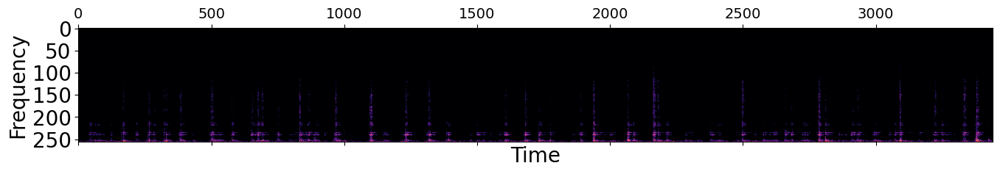

Going through autoencoder call
Input features to encoder: {'audio': <tf.Tensor: shape=(1, 80, 1720), dtype=float32, numpy=
array([[[ -7.109971 ,  -6.608448 ,  -6.7221193, ...,  -5.5106487,
          -5.8220162,  -6.176061 ],
        [ -7.7034764,  -7.206553 ,  -6.995977 , ...,  -6.167853 ,
          -6.4099236,  -6.646777 ],
        [ -8.071467 ,  -7.6775217,  -7.554845 , ...,  -6.819562 ,
          -7.071287 ,  -7.4554186],
        ...,
        [-11.627188 , -11.463965 , -11.557015 , ..., -11.299981 ,
         -11.683129 , -12.060566 ],
        [-11.648957 , -11.511373 , -11.501224 , ..., -11.386307 ,
         -11.813171 , -11.941763 ],
        [-11.795404 , -11.911609 , -11.365958 , ..., -11.543082 ,
         -11.889729 , -12.223261 ]]], dtype=float32)>, 'mel_spec': <tf.Tensor: shape=(1, 80, 1720), dtype=float32, numpy=
array([[[ -7.109971 ,  -6.608448 ,  -6.7221193, ...,  -5.5106487,
          -5.8220162,  -6.176061 ],
        [ -7.7034764,  -7.206553 ,  -6.995977 , ...,  -6.167853 

Current output keys (will be used for next processor input):  dict_keys(['inputs', 'audio', 'mel_spec', 'material_id', 'video_id', 'z', 'material_embedding', 'magnitudes', 'stdevs', 'taus', 'gains', 'frequencies', 'dampings', 'tau_bias', 'acceleration_scalar', 'reverb_gain', 'reverb_decay', 'noise_magnitudes', 'impact', 'modal_fir', 'convolve', 'filtered_noise'])
Necessary input_keys:  ListWrapper(['filtered_noise/signal', 'convolve/signal'])
Current output keys (will be used for next processor input):  dict_keys(['inputs', 'audio', 'mel_spec', 'material_id', 'video_id', 'z', 'material_embedding', 'magnitudes', 'stdevs', 'taus', 'gains', 'frequencies', 'dampings', 'tau_bias', 'acceleration_scalar', 'reverb_gain', 'reverb_decay', 'noise_magnitudes', 'impact', 'modal_fir', 'convolve', 'filtered_noise', 'add1'])
Necessary input_keys:  ListWrapper(['impact/signal', 'acceleration_scalar'])
Current output keys (will be used for next processor input):  dict_keys(['inputs', 'audio', 'mel_spec'

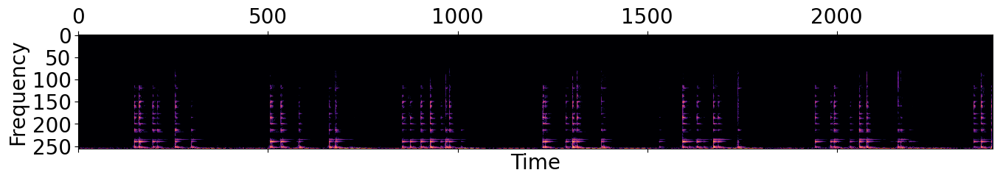

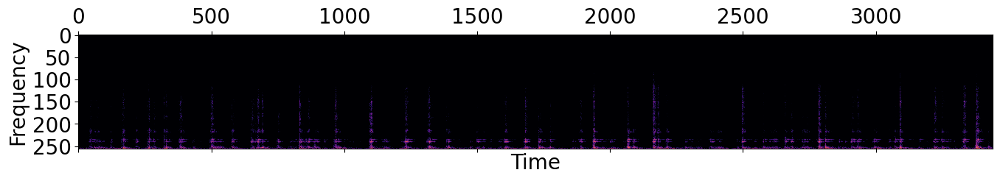

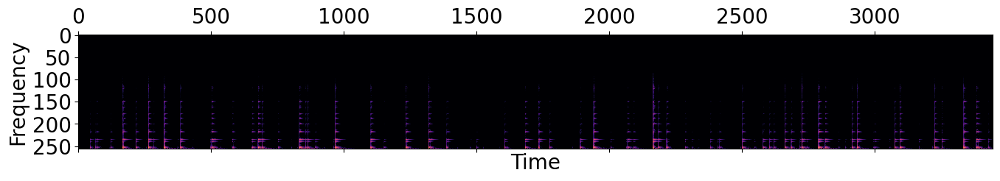

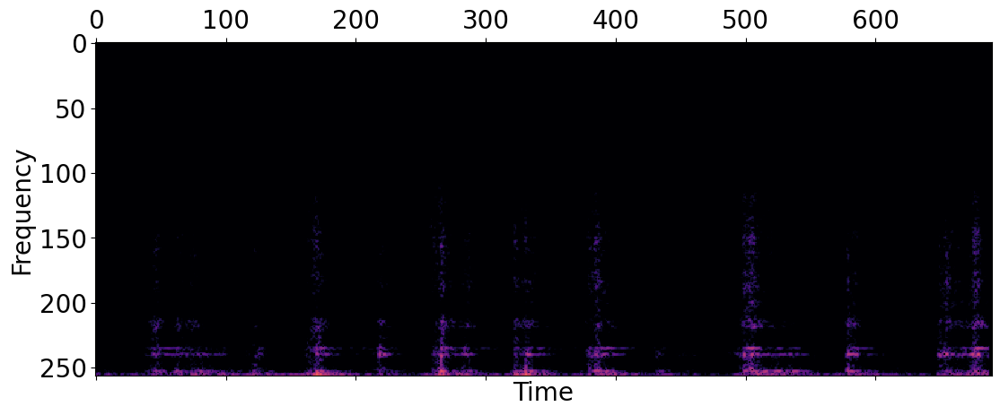

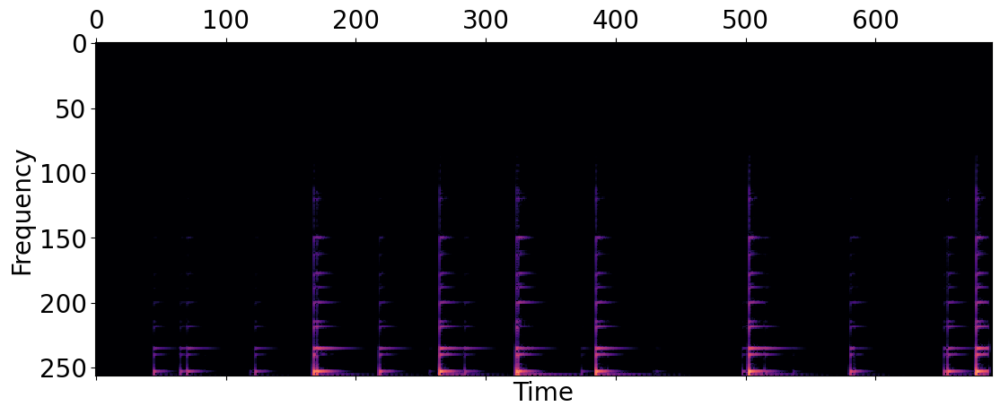

Output synth of the checkpoint from prediction[audio_synth]


passing through high pass filter...


keys of impact:  dict_keys(['signal', 'controls'])
Plotting impulse profile


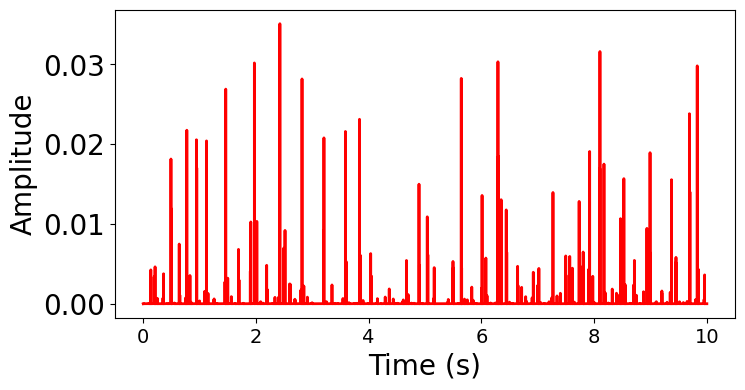

Plotting network output modal response
(176400,)


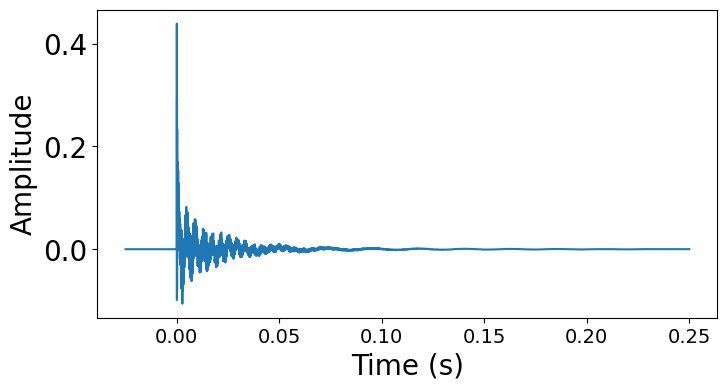

input shapes! impulse_profile: (1, 882000), ir: (1, 176400), noise: (1, 882000), revc: (1, 48000)
method of resample:  window
n_frames: 2521 and n_intervals: 2520
dimensionts from the image resize output:  (1, 882000, 1)
method of resample:  window
n_frames: 2521 and n_intervals: 2520
dimensionts from the image resize output:  (1, 882000, 1)
compared elements of modal response: [[False False False ...  True  True  True]]
average difference:  tf.Tensor(-4.901126e-06, shape=(), dtype=float32)
original impulse profile:  tf.Tensor([[0. 0. 0. ... 0. 0. 0.]], shape=(1, 882000), dtype=float32)
element-wise comparison of network output impulse profile and from scratch: False
impulse profile shape:  (1, 882000)
Size of frequency envelope:  (1, 1, 256)
size of amplitude envelop:  (1, 256)
Size of frequency envelope:  (1, 88200, 256)
size of amplitude envelop:  (1, 88200, 256)
Size of frequency envelope:  (1, 88200, 256)
size of amplitude envelop:  (1, 88200, 256)
Plotting convolve generated moda

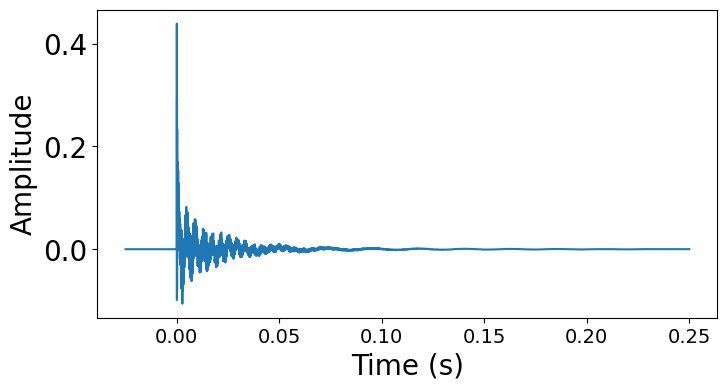

model's output modal response:  tf.Tensor(
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.9833462e-09
  2.9742941e-09 2.9652147e-09]], shape=(1, 176400), dtype=float32)
ir_scratch:  tf.Tensor(
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.9833462e-09
  2.9742941e-09 2.9652147e-09]], shape=(1, 176400), dtype=float32)
ir:  tf.Tensor(
[[0.0000000e+00 0.0000000e+00 0.0000000e+00 ... 2.9833462e-09
  2.9742941e-09 2.9652147e-09]], shape=(1, 176400), dtype=float32)
compared elements of modal response: [[ True  True  True ...  True  True  True]]
element-wise comparison of network output modal response and from scratch: True
impulse response shape:  [1, 1, 176400]
audio_frames shape:  (1, 1, 882000)
n_audio_frames: 1 and n_ir_frames: 1
convolved shape:  (1, 882000)
Return audio without adding noise, acceleration sound, or reverb
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output

audio element-wise check:  tf.Tensor(False, shape=(), dtype=bool)
network audio synth: [[ 6.4776987e-06  9.9956915e-06  8.4240110e-06 ... -2.4984311e-04
  -2.4361900e-04 -2.4060736e-04]]
convolve output: [[-6.8700004e-08 -8.5204235e-08 -8.6151886e-08 ... -4.5020058e-04
  -4.6067615e-04 -4.6153556e-04]]
differences: [[6.5463987e-06 1.0080896e-05 8.5101628e-06 ... 2.0035746e-04
  2.1705715e-04 2.2092820e-04]]
average of the differences:  tf.Tensor(-3.9988874e-05, shape=(), dtype=float32)
Plotting audio synth waveform


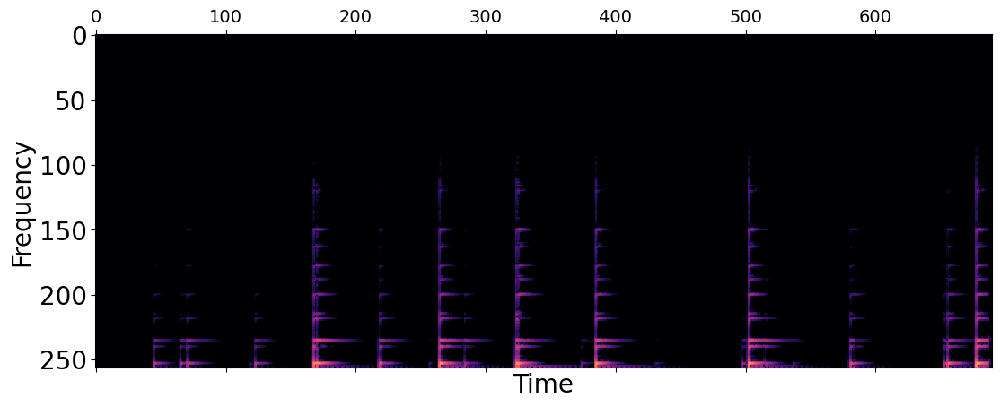

Plotting convolve waveform


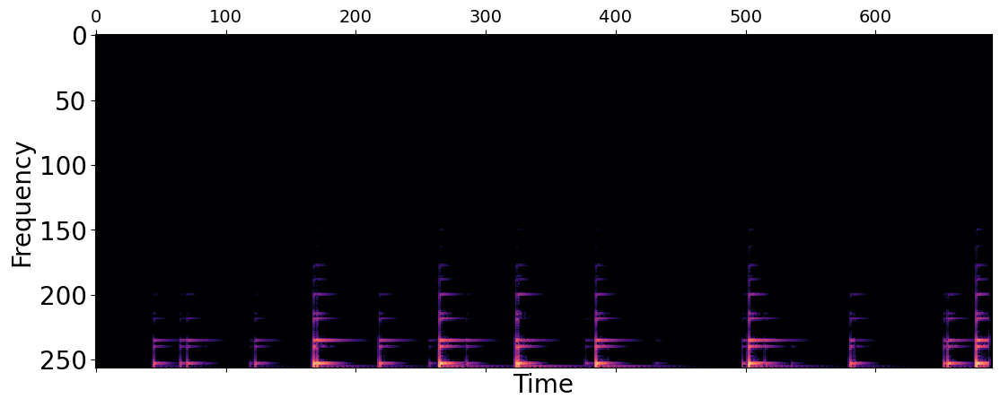

Plotting impact profile vs. audio vs. synth
Impulse profile shape:  (1, 882000)
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
Plotting final audio amplitude


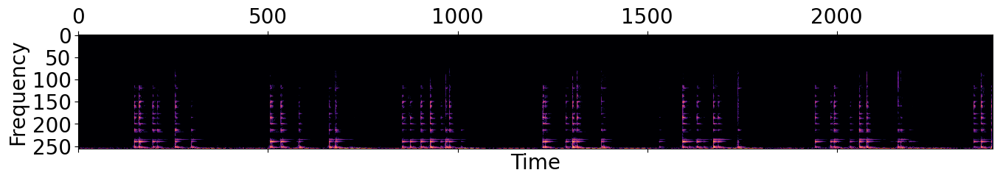

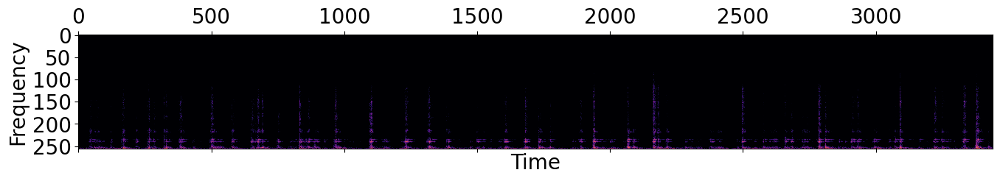

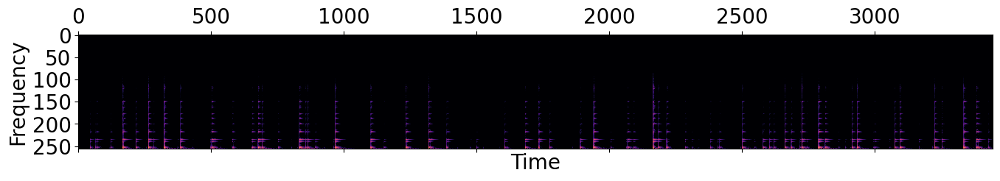

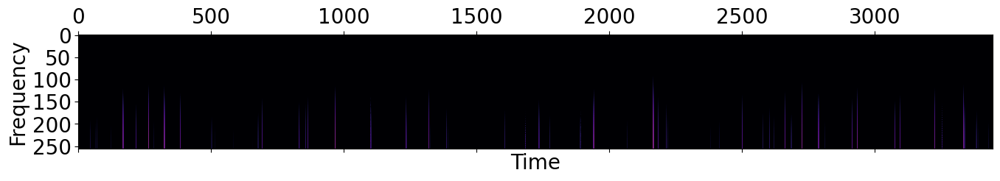

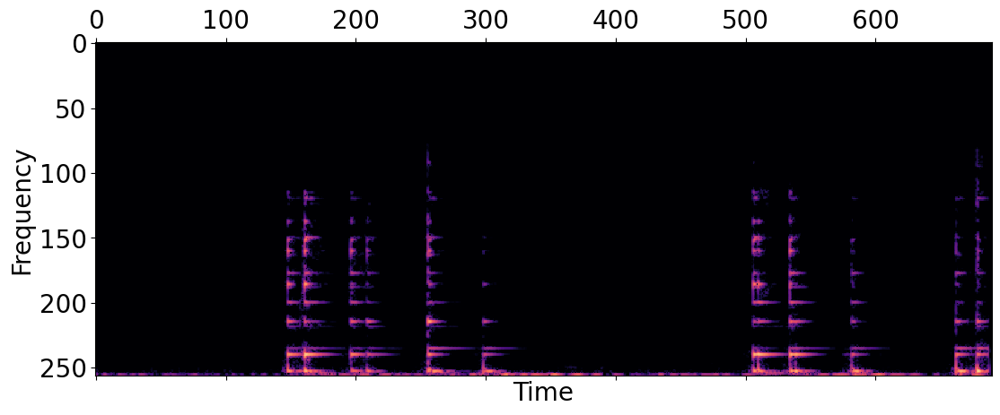

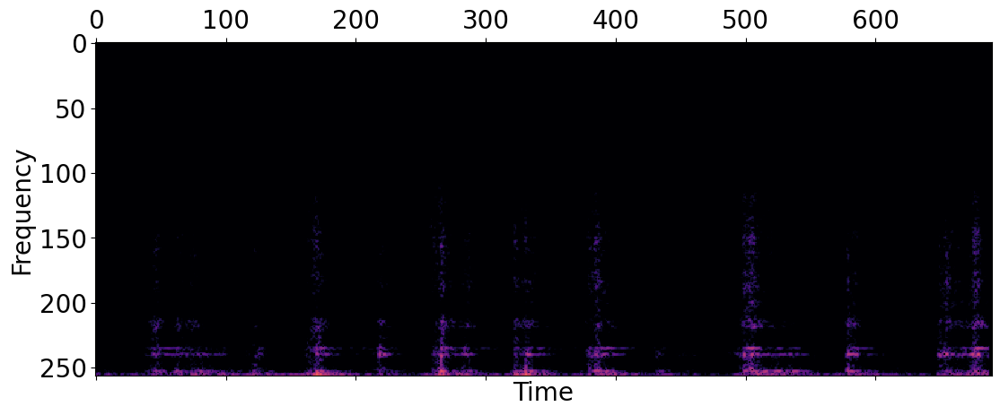

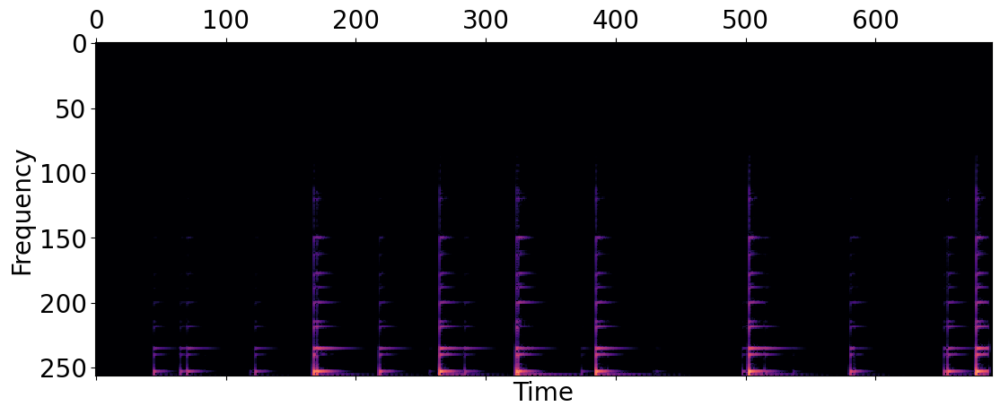

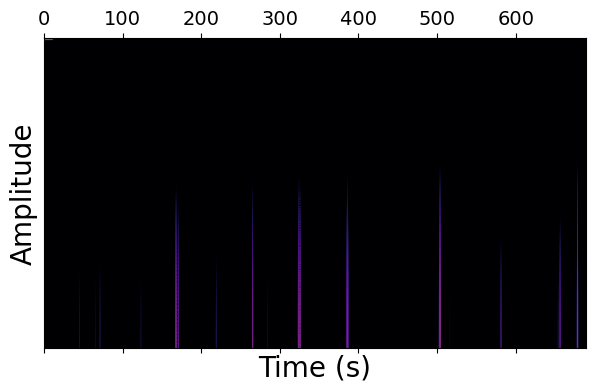

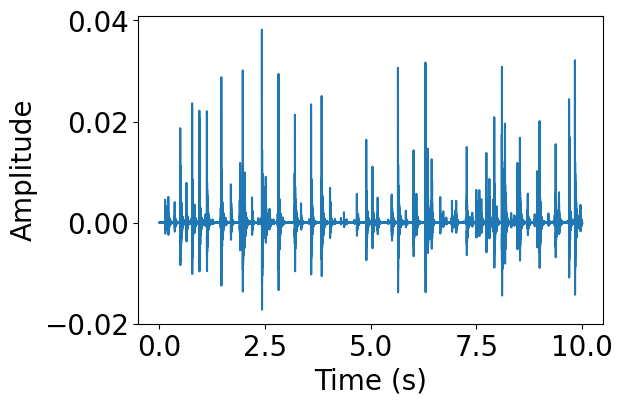

mags shape: (1, 2520, 1)
stdevs shape: (1, 2520, 1)
taus shape: (1, 2520, 1)
num non-zeroes in taus:  tf.Tensor(2520, shape=(), dtype=int64)
tf.Tensor(
[[[-2.1878195]
  [-2.2222345]
  [-2.2465124]
  ...
  [-2.2462115]
  [-2.2432094]
  [-2.2461698]]], shape=(1, 2520, 1), dtype=float32)
stdevs:  tf.Tensor(0, shape=(), dtype=int64)
magnitudes non zeros:  tf.Tensor(2473, shape=(), dtype=int64)
tf.Tensor(
[[[-3.5428627]
  [-3.5948164]
  [-3.743254 ]
  ...
  [-3.226508 ]
  [-3.269201 ]
  [-3.3084767]]], shape=(1, 2520, 1), dtype=float32)
non zeros in impulse profile:  tf.Tensor(0, shape=(), dtype=int64)
Audio title:  sIgkTYTWPz8-004-0040


In [8]:
# Test out the N_MODAL_FREQUENCIES=256 checkpoint for multiclass checkpoint
from IPython.display import display
no_axis = True

# Path to eval output
#eval_output = "/juno/u/jyau/regnet/ckpt/visual_extract_pipeline_rgb_only/checkpoint_075000/eval_output"
# Full pipeline
voc_type = "ceramic-plate" #"silicone-pad" #"wooden-box" # wood-box
vocoder_type = 'silicon-coaster'  #'wooden-box'

ckpt_path = "/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/"
# ckpt_name = f'sam-diffimpact-ckpts-multiclass/'
ckpt_name = f"sam-five-class-high-pass-waveglow-mel-spec-multiclass"
# ckpt_name = f"sam-five-class-high-pass-waveglow-mel-spec-multiclass-extra-steps"
# ckpt_name = "multiclass-cleaned-diffimpact-high-pass-embed-vec-32-with-regularizer"
# ckpt_name = "multiclass-cleaned-diffimpact-waveglow-mel-spec-high-pass-embed-vec-32-with-regularizer-continued"
# ckpt_name = "tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-verify-last"
# save_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/multiclass-1hr/'
save_dir = os.path.join(ckpt_path, ckpt_name)
# save_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/sam-data-high-pass-multiclass-extra-4000-steps/'
# save_dir = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/tapping-embed-vec-len-32-high-pass-multiclass"
# save_dir = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass"
# save_dir = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-extended-training"
# save_dir = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-more-extended-training"
# save_dir = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-last-training"
# save_dir = os.path.join(ckpt_path, "tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-verify-last")

# Output directory
output_path = ""

"""Single class checkpoints"""
# save_dir = f'/juno/u/jyau/regnet/ddsp/diffimpact/asmr/regnet-labels/1hr-{vocoder_type}'
# save_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/checkpoints/{voc_type}' # Sam's checkpoint
# save_dir = '/juno/u/jyau/regnet/ddsp/diffimpact/asmr/regnet-labels/train-all'
example_secs = 10
offset_secs = 0

# Material ID input
material_id = 3

latest_operative_config = ddsp.training.train_util.get_latest_operative_config(save_dir)
# latest_operative_config = os.path.join(save_dir, 'operative_config-0.gin')
gin.parse_config_file(latest_operative_config)
print("Latest operative config used: ", latest_operative_config)

n_modal_freq = gin.config.query_parameter('%N_MODAL_FREQUENCIES')
print(f"n modal frequencies: {n_modal_freq}")
#gin.config.bind_parameter('%N_MODAL_FREQUENCIES', 64)
#n_modal_freq = gin.config.query_parameter('%N_MODAL_FREQUENCIES')
#print(f"n modal frequencies: {n_modal_freq}")

print("Original internal audio samples: ", gin.config.query_parameter("%INTERNAL_AUDIO_SAMPLES"))
train_sample_rate = gin.config.query_parameter('%AUDIO_SAMPLE_RATE')
train_samples = gin.config.query_parameter('%N_AUDIO_SAMPLES')

audio_sample_rate = train_sample_rate

train_z_steps = gin.config.query_parameter('MfccTimeDistributedRnnEncoder.z_time_steps')
offset_samples = int(offset_secs * train_sample_rate)
test_samples = int(example_secs * train_sample_rate)

test_z_steps = int(example_secs / (train_samples / train_sample_rate) * train_z_steps)
gin.config.bind_parameter('%N_AUDIO_SAMPLES', test_samples)

# Change the MFCC mel samples if using waveglow calculation
new_mel_samples = example_secs * 172
gin.config.bind_parameter('MfccTimeDistributedRnnEncoder.mel_samples', new_mel_samples)
print("mel samples: ", new_mel_samples)
try:
    # Change internal sample rate to be same as audio sample rate
#     gin.config.bind_parameter('%INTERNAL_SAMPLE_RATE', gin.config.query_parameter('%AUDIO_SAMPLE_RATE'))
    
    train_internal_sample_rate = gin.config.query_parameter('%INTERNAL_SAMPLE_RATE')
    print("Internal sampler rate: ", train_internal_sample_rate)
    
    test_internal_samples = int(example_secs * train_internal_sample_rate)
    gin.config.bind_parameter('%INTERNAL_AUDIO_SAMPLES', test_internal_samples)
    gin.config.bind_parameter('FilteredNoise.initial_bias', gin.config.query_parameter('FilteredNoise.initial_bias') - 1.0)
    print(f"Internal audio samples: {gin.config.query_parameter('%INTERNAL_AUDIO_SAMPLES')}")
except ValueError:
    pass
gin.config.bind_parameter('FilteredNoiseExpDecayReverb.gain_initial_bias', -4)
gin.config.bind_parameter('FilteredNoiseExpDecayReverb.decay_initial_bias', 4.0)
gin.config.bind_parameter('MfccTimeDistributedRnnEncoder.z_time_steps', test_z_steps)

print(gin.config.query_parameter('FilteredNoiseExpDecayReverb.gain_initial_bias'))
print(gin.config.query_parameter('FilteredNoiseExpDecayReverb.decay_initial_bias'))
print(gin.config.query_parameter('%VALIDATION_FILE_PATTERN'))
print("test z time steps: ", gin.config.query_parameter('MfccTimeDistributedRnnEncoder.z_time_steps'))
print("test internal audio samples: ", gin.config.query_parameter("%INTERNAL_AUDIO_SAMPLES"))

# Do not include noise in impact synth
# gin.config.bind_parameter("Impact.include_noise", False)


# Use Regnet predicted mel spectrogram as input
gin.config.bind_parameter('MfccTimeDistributedRnnEncoder.mel_bins', 80)
gin.config.bind_parameter('MfccTimeDistributedRnnEncoder.spectral_fn', gin.config.parse_value("@ddsp.spectral_ops.compute_mfcc_mel_spec"))
print(gin.config.query_parameter('MfccTimeDistributedRnnEncoder.spectral_fn'))
print(gin.config.query_parameter('MfccTimeDistributedRnnEncoder.mel_bins'))

model = ddsp.training.models.get_model()
model.restore(save_dir)

# Loading and processing audio
MAX_WAV_VALUE = 32768.0

audio_type = "pred" # "pred"
example_type = "val" # "train"

# audio_title = "vas_wood"
# audio_title = "FFmXszcvt58-003-0010"
# audio_title = "FFmXszcvt58-003-0023"
# audio_title = "sIgkTYTWPz8-004-0000"
# audio_title = "sIgkTYTWPz8-004-0010"
# audio_title = "sIgkTYTWPz8-004-0025"
audio_title = "sIgkTYTWPz8-004-0040"
# audio_title = "sIgkTYTWPz8-001-0020"
# audio_title = "sIgkTYTWPz8-001-0036"
# audio_title = "sIgkTYTWPz8-002-0009"
# audio_title = "IlJYaR2D7GU-012-0020"
# audio_title = "IlJYaR2D7GU-009-0010"
# audio_title = "sIgkTYTWPz8-005-0040"
# audio_title = 'ASMR_Addictive_Tapping_1_Hr_No_Talking-silicon-coaster-29-of-48'
# audio_title = "ASMR_Brain_Penetrating_3D_Tapping_No_Talking-101-of-240"
# audio_title = "compilation_final"
# audio_title = "The_Ultiimate_Tapping_ASMR_3_Hours_No_Talking-ceramic-17-of-22"
# audio_title = 'ASMR_Addictive_Tapping_1_Hr_No_Talking-glass-bowl-34-of-47'
# audio_title = "ASMR_Addictive_Tapping_1_Hr_No_Talking-wooden-box-42-of-45"
#audio = tf.io.read_file('/juno/u/spclarke/asmr_data/tapping/materials/valid/sIgkTYTWPz8-004-0000.wav')
#audio = tf.io.read_file(f'/juno/u/jyau/regnet/data/features/ASMR/asmr_both_vids/audio_ori/{audio_title}.wav')
print("Audio title: ", audio_title)
force_profile_model_name = "five_class_impact_profile_backprop_only_l1_pretrained_regnet_reweighted_lr_2e-5"
regnet_model = "regnet_tapping_materials_five_subset_orig"
regnet_eval_dir = "last_ckpt_eval"
regnet_model_ckpt = "checkpoint_009000_outputs"
regnet_vocoder = "TrainAll"

try:
    if audio_type == "pred":
        print("Audio to play is pred...")
        if example_type == "train":
#             audio = tf.io.read_file(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_train_subset_eval/checkpoint_018000_outputs/TrainAll/{audio_title}_synthesis.wav")
            audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_train_subset_eval/checkpoint_009000_outputs/TrainAll/{audio_title}_synthesis.wav')
        else:
            print("------------Using validation example---------------")
#             audio = tf.io.read_file(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval_new_waveglow/checkpoint_018000_outputs/WaveGlowWeights/{audio_title}_synthesis.wav")
            audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/{regnet_eval_dir}/{regnet_model_ckpt}/{regnet_vocoder}/{audio_title}_synthesis.wav')
    else:
        print("Getting ground truth audio...")
#         audio = tf.io.read_file(f"/juno/u/jyau/asmr-video-to-sound/ckpt/impact_components_material_classification_init/mel_spec_eval_gt/{audio_title}_gt_synthesis.wav")
        audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/mel_spec_eval_gt/{audio_title}_gt_synthesis.wav')
#     audio = tf.io.read_file(f'/juno/u/jyau/regnet/data/features/ASMR/orig_asmr_by_material_clips/audio_10s_44100hz_ddsp/1hr/{vocoder_type}/train/{audio_title}.wav')
except Exception as ex:
    audio = tf.io.read_file(f'/juno/u/jyau/regnet/data/features/ASMR/orig_asmr_by_material_clips/audio_10s_44100hz_ddsp/1hr/{vocoder_type}/val/{audio_title}.wav')
# audio = tf.io.read_file(f'/juno/u/jyau/regnet/data/features/ASMR/ASMR_Brain_3D_Tapping/audio_10s_44100hz/{audio_title}.wav')
#compare_audio = tf.io.read_file(f'/juno/u/jyau/regnet/data/features/ASMR/asmr_both_vids/audio_ori/{audio_title}.wav')
# Ground truth
#orig_audio = np.load(f'/juno/u/jyau/regnet/data/features/ASMR/asmr_both_vids/melspec_10s_44100hz/{audio_title}_audio.npy')
#audio = np.load(f"/juno/u/jyau/regnet/ckpt/asmr_full/inference_test/{audio_title}.npy")

print("audio shape: ", tf.shape(audio))
decoded_audio_init, audio_sample_rate = tf.audio.decode_wav(audio, desired_channels=1)
print("decoded audio first shape: ", decoded_audio_init.shape)

#decoded_audio = decoded_audio * # Test by inputting zero vector audio
decoded_audio = tf.expand_dims(tf.squeeze(decoded_audio_init[offset_samples:(offset_samples + test_samples)]), axis=0)
#decoded_audio = tf.expand_dims(tf.squeeze(decoded_audio), axis=0)
print(decoded_audio.shape)
print("audio sample_rate: ", audio_sample_rate)

if example_type == "val":
#     gt_audio = tf.io.read_file(f"/juno/u/jyau/regnet/data/features/carlota_videos/audio_10s_44100hz/{audio_title}.wav")
    gt_audio = tf.io.read_file(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/valid/{audio_title}.wav')\
#tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_medium_batch/mel_spec_eval_gt/{audio_title}_gt_synthesis.wav')
else:
    gt_audio = tf.io.read_file(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/train/{audio_title}.wav')
gt_audio_init, asr = tf.audio.decode_wav(gt_audio, desired_channels=1)
gt_audio = tf.expand_dims(tf.squeeze(gt_audio_init[offset_samples:(offset_samples + test_samples)]), axis=0)

# Regnet spectrogram output
if audio_type == "pred":
#     print("Using intermediate spectrogram to input to Diffimpact checkpoint")
    if example_type == "val":
#         reg_output_path = f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_force_best_regnet_ckpt_eval/"
        reg_output_path = f'/juno/u/jyau/regnet/ckpt/{regnet_model}/{regnet_eval_dir}/'
    elif example_type == "train":
        reg_output_path = f"/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_train_subset_eval/"
#         reg_output_path = f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_force_best_regnet_ckpt_train_subset_eval/"
    spec = np.load(os.path.join(reg_output_path, f'{audio_title}.npy'))
else:
    print("Getting ground truth")
    reg_output_path = f"/juno/u/jyau/asmr-video-to-sound/ckpt/impact_components_material_classification_init/mel_spec_eval_gt/"
    spec = np.load(os.path.join(reg_output_path, f'{audio_title}_gt.npy'))
spec = tf.expand_dims(tf.convert_to_tensor(spec), axis=0)
print("Regnet output path: ", reg_output_path)
print("loaded regnet spectrogram: ", spec)
#spec = tf.transpose(spec, perm=[0,2,1])
print(spec.shape)
print(spec.shape[-1] == gin.config.query_parameter('MfccTimeDistributedRnnEncoder.mel_bins'))


# test_input = tf.data.Dataset.from_tensor_slices({'audio':decoded_audio, 'material_id':[material_id], 'video_id':[0]}).batch(2)
test_input = tf.data.Dataset.from_tensor_slices({'audio':spec, 'mel_spec':spec, 'material_id':[material_id], 'video_id':[0]}).batch(2)
print("input to the model: ", test_input)
display(IPython.display.Audio(data=decoded_audio, rate=int(train_sample_rate)))

print("Ground truth audio")
display(IPython.display.Audio(data=gt_audio, rate=int(train_sample_rate)))


# Plotting audio waveforms
print("Plotting original waveform")
output_dir = save_dir #f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/asmr/ckpt/sam-diffimpact-ckpts-multiclass/'
# plot_spec(decoded_audio, 512)
ddsp.colab.colab_utils.specplot(decoded_audio, size=512)
fig = plt.gcf()
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
#     ax.axes.yaxis.set_ticks([])
    plt.ylabel('Frequency')
    plt.xticks(fontsize=font_size-6)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_orig_audio.png'), bbox_inches='tight')
plt.show()

# audio of length of around 0.5 seconds (22050/256= 86 .1) for audio sampling rate 44100 and hop length 256
# Note that Sam's model uses mel_bins=128!
prediction = model(next(iter(test_input)), training=False)
print(f"prediction keys: {prediction.keys()}")
print("input audio shape: ", prediction['audio'].shape)
print("pred audio synth shape: ", prediction['audio_synth'].shape)
ddsp.colab.colab_utils.specplot(gt_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :], size=512)#prediction['audio'][:1, :], size=512)
ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :train_sample_rate*2], size=512)
plt.show()

print("Output synth of the checkpoint from prediction[audio_synth]")
display(IPython.display.Audio(data=prediction['audio_synth'][:1, :], rate=int(train_sample_rate)))
# IPython.display.Audio(data=prediction['modal_fir']['signal'][:1, :], rate=int(audio_sample_rate))

# scipy.io.wavfile.write(filename, fs, np.array(32767 * audio[i, :] / np.max(np.abs(audio))).astype(np.int16))
audio_path = f"{os.path.join(save_dir, audio_title+f'_{audio_type}_synth_from_mel_spec_'+ str(material_id) +'.wav')}"
transpose_aud = np.transpose(prediction['audio_synth'][:1, :].numpy())
scipy.io.wavfile.write(audio_path, audio_sample_rate,
      np.array(32767 * transpose_aud / np.max(np.abs(prediction['audio_synth']))).astype('int16'))

# Sending synth output through high pass filter
clip = high_pass_filter(prediction['audio_synth'][:1, :], train_sample_rate)
print("passing through high pass filter...")
display(IPython.display.Audio(data=clip, rate=int(44100)))

# Generate audio by replacing the frequency with eval
#samplerate, data = wavfile.read(wav_fname)
# print(f"number of channels = {data.shape[1]}")
# number of channels = 2
# length = data.shape[0] / samplerate
# print(f"length = {length}s")
# length = 0.01s

# modal_fir = ddsp.synths.ModalFIR(n_samples=int(fs*sample_factor/1.0), sample_rate=int(fs*sample_factor),
#                             initial_bias=-1.5, hz_max=20000.0, freq_scale_fn=ddsp.core.frequencies_critical_bands, freq_scale='mel')
# Note that clip is the data in example above, so clip.shape[0] is the length of the audio: seconds * sample rate
# impact = ddsp.synths.Impact(sample_rate=int(fs*sample_factor), n_samples=int(clip.shape[0]*sample_factor), max_impact_frequency=20, mag_scale_fn=ddsp.core.exp_sigmoid, include_noise=True)
# reverb = ddsp.effects.FilteredNoiseExpDecayReverb(trainable=False, reverb_length=int(48000 * sample_factor), decay_initial_bias=4.0, add_dry=True)
# Initialize modules
sample_factor = 2 # 2 if using doubled audio sampling rate for internal sample rate
modal_fir = ddsp.synths.ModalFIR(n_samples=int(sample_factor * train_sample_rate), sample_rate=int(sample_factor * train_sample_rate),
                            initial_bias=-1.5, hz_max=20000.0, freq_scale_fn=ddsp.core.frequencies_critical_bands, freq_scale='mel')
# Impact synth can include_noise=True, which adds random noise based on stdevs, or not
impact = ddsp.synths.Impact(sample_rate=int(sample_factor * audio_sample_rate),
                            n_samples=int(sample_factor * (example_secs * audio_sample_rate)),
                            max_impact_frequency=20, mag_scale_fn=ddsp.core.exp_sigmoid, include_noise=False)
reverb = ddsp.effects.FilteredNoiseExpDecayReverb(trainable=False, reverb_length=int(48000 * sample_factor), decay_initial_bias=4.0, add_dry=True)

# Extracting important components from the Diffimpact prediction output
acceleration_scale = prediction['acceleration_scalar']
impulse_profile = prediction['impact']['signal']
ir = prediction['modal_fir']['signal'] # modal response
noise = prediction['filtered_noise']['signal']
revc = prediction['reverb']['controls']['ir'] #np.concatenate((np.zeros(begin_offset), np.squeeze(prediction['reverb']['controls']['ir'])))

# Plotting impact/force profile
print("keys of impact: ", prediction['impact'].keys())
print("Plotting impulse profile")
output_dir = os.path.join(save_dir, f'impact_profile_noaxis')
os.makedirs(output_dir, exist_ok=True)

t2 = np.linspace(0, test_samples/train_sample_rate, test_samples * sample_factor) #2 if doubled internal sample rate
# t2 = np.linspace(0, test_samples/train_sample_rate, test_samples)
plt.plot(t2, np.squeeze(prediction['impact']['signal']), c='red', linewidth=2)
plt.ylabel('Amplitude')
plt.xlabel('Time (s)')
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
#     ax.axes.yaxis.set_ticks([])
    plt.xticks(fontsize=font_size-6)
    
fig = plt.gcf()
fig.set_size_inches(fig_width+2, fig_height)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_impact_signal_only-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

# Plotting the network output modal response
print("Plotting network output modal response")
output_dir = os.path.join(save_dir, f'modal_fir')
os.makedirs(output_dir, exist_ok=True)
begin_offset = int(train_sample_rate * 1.95)
cutoff = int(train_sample_rate * 2.5)

ir_plot = np.squeeze(prediction['modal_fir']['signal']) # modal response
print(ir_plot.shape)
ir_plot = ir_plot[begin_offset:cutoff]
t2 = (np.arange(0, ir_plot.shape[0])  - (train_sample_rate * 2 - begin_offset)) / (2 * train_sample_rate)
plt.plot(t2, ir_plot)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
fig = plt.gcf()
fig.set_size_inches(fig_width+2, fig_height)
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
#     ax.axes.yaxis.set_ticks([])
    plt.xticks(fontsize=font_size-6)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_ir-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

print(f"input shapes! impulse_profile: {impulse_profile.shape}, ir: {ir.shape}, noise: {noise.shape}, revc: {revc.shape}")

audio_final = generate_audio(prediction, modal_fir, reverb, impact, impulse_profile,
                             prediction['modal_fir']['controls']['gains'],
                             prediction['modal_fir']['controls']['frequencies'],
                             prediction['modal_fir']['controls']['dampings'],
                             ir, noise, acceleration_scale, revc, audio_sample_rate, example_secs, output_dir,
                             scratch='raw',
                             modal_fir_only=True)

print(f"final audio shape: {audio_final.shape} compared to audio_synth shape: {prediction['audio_synth'].shape}")
display(IPython.display.Audio(data=audio_final, rate=int(train_sample_rate)))

# Save convolved audio
# The write function in scipy.io.wavfile expects the input array to have the shape (num_samples, num_channels)
# https://stackoverflow.com/questions/40822877/scipy-io-cant-write-wavfile
# For example shape (2, 40000) is incorrect, need transposing
audio_path = f"{os.path.join(save_dir, audio_title+f'_{audio_type}_melspec_input_convolve_impact_modal_only_'+ str(material_id) +'.wav')}"
transposed_audio = np.transpose(audio_final.numpy())
scipy.io.wavfile.write(audio_path, audio_sample_rate,
      np.array(32767 * transposed_audio / np.max(np.abs(audio_final))).astype('int16'))


test_audio = tf.math.equal(prediction['audio_synth'], audio_final)
print("audio element-wise check: ", tf.reduce_any(test_audio))

if not tf.reduce_all(tf.math.equal(prediction['audio_synth'], audio_final)):
    print(f"network audio synth: {prediction['audio_synth']}")
    print(f"convolve output: {audio_final}")
    print(f"differences: {prediction['audio_synth'] - audio_final}")
    print('average of the differences: ', tf.math.reduce_mean(prediction['audio_synth'] - audio_final))

# Plotting audio waveforms
print("Plotting audio synth waveform")
output_dir = os.path.join(save_dir, f'final_audio')
os.makedirs(output_dir, exist_ok=True)
# plot_spec(prediction['audio_synth'][:1, :train_sample_rate*2], 512)
ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :train_sample_rate*2], size=512)
fig = plt.gcf()
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
#     ax.axes.yaxis.set_ticks([])
    plt.ylabel('Frequency')
    plt.xticks(fontsize=font_size-6)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_synth_wav-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

# Plotting audio waveforms
print("Plotting convolve waveform")
# plot_spec(audio_final[:1, :train_sample_rate*2], 512)
ddsp.colab.colab_utils.specplot(audio_final[:1, :train_sample_rate*2], size=512)
fig = plt.gcf()
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
#     ax.axes.yaxis.set_ticks([])
    plt.ylabel('Frequency')
    plt.xticks(fontsize=font_size-6)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_convolve_wav-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

print("Plotting impact profile vs. audio vs. synth")
print("Impulse profile shape: ", impulse_profile.shape)
ddsp.colab.colab_utils.specplot(gt_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :], size=512)
ddsp.colab.colab_utils.specplot(ddsp.core.resample(impulse_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :], size=512)

ddsp.colab.colab_utils.specplot(gt_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(ddsp.core.resample(impulse_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :train_sample_rate*2], size=512)


print("Plotting final audio amplitude")
output_dir = os.path.join(save_dir, f'final_audio')
os.makedirs(output_dir, exist_ok=True)

plt.plot(np.arange(0, train_sample_rate*example_secs) / train_sample_rate, np.squeeze(prediction['audio_synth'][:1,:]))
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
fig = plt.gcf()
fig.set_size_inches(fig_width+1, fig_height)
if no_axis:
    ax = plt.gca()
    # ax.axes.yaxis.set_visible(False)
    ax.axes.yaxis.set_ticks([])
    plt.xticks(fontsize=font_size-6)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_waveform-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()
plt.rcParams.update({
    "axes.facecolor":    (1.0, 1.0, 1.0, 0.2),
})
plt.plot(np.arange(0, train_sample_rate*example_secs) / train_sample_rate, np.squeeze(prediction['audio_synth'][:1,:]))
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
fig = plt.gcf()
fig.set_size_inches(fig_width, fig_height)
fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_waveform_translucent-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

# Check shape of the impact info
print(f"mags shape: {prediction['magnitudes'].shape}")
print(f"stdevs shape: {prediction['stdevs'].shape}")
print(f"taus shape: {prediction['taus'].shape}")

print("num non-zeroes in taus: ", tf.math.count_nonzero(tf.math.round(prediction['taus'])))
print(prediction['taus'])
print("stdevs: ", tf.math.count_nonzero(tf.math.round(prediction['stdevs']))) # only noise
print("magnitudes non zeros: ", tf.math.count_nonzero(tf.math.round(prediction['magnitudes'])))
print(prediction['magnitudes'])
print("non zeros in impulse profile: ", tf.math.count_nonzero(tf.math.round(impulse_profile)))

print("Audio title: ", audio_title)

input to the model:  <BatchDataset shapes: {audio: (None, 80, 1720), mel_spec: (None, 80, 1720), material_id: (None,), video_id: (None,)}, types: {audio: tf.float32, mel_spec: tf.float32, material_id: tf.int32, video_id: tf.int32}>
Going through autoencoder call
Input features to encoder: {'audio': <tf.Tensor: shape=(1, 1720, 80), dtype=float32, numpy=
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)>, 'mel_spec': <tf.Tensor: shape=(1, 1720, 80), dtype=float32, numpy=
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]], dtype=float32)>, 'material_id': <tf.Tensor: shape=(1,), dtype=i

Current output keys (will be used for next processor input):  dict_keys(['inputs', 'audio', 'mel_spec', 'material_id', 'video_id', 'z', 'material_embedding', 'magnitudes', 'stdevs', 'taus', 'gains', 'frequencies', 'dampings', 'tau_bias', 'acceleration_scalar', 'reverb_gain', 'reverb_decay', 'noise_magnitudes', 'impact', 'modal_fir', 'convolve', 'filtered_noise', 'add1', 'acceleration_multiply', 'add2', 'reverb'])
Necessary input_keys:  ListWrapper(['reverb/signal'])
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
Using predicted force profile components...
**************************************************Impact comp dir: 
 /juno/u/jyau/asmr-video-to-sound/ckpt/five_class_impact_profile_backprop_only_l1_pretrained_regnet_reweighted_lr_2e-5/last_ckpt_eval_new_waveglow/impact_components/
(1, 2520, 1)
mags shape: (1, 2520, 1), taus shape: (1, 2520, 1), stdevs 

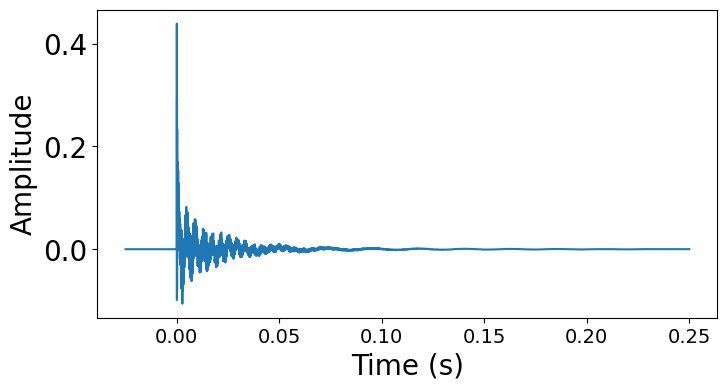

compared elements of modal response: [[ True  True  True ...  True  True  True]]
element-wise comparison of network output modal response and from scratch: True
impulse response shape:  [1, 1, 176400]
audio_frames shape:  (1, 1, 882000)
n_audio_frames: 1 and n_ir_frames: 1
convolved shape:  (1, 882000)
Return audio without adding noise, acceleration sound, or reverb
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
Impact profile:  tf.Tensor(
[[1.4922062e-16 6.1441409e-16 2.4413859e-15 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]], shape=(1, 882000), dtype=float32)
pred impact profile non zeros:  tf.Tensor(0, shape=(), dtype=int64)
impact audio shape: (1, 441000) compared to audio_synth shape: (1, 441000)


Plots of impact profile
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
method of resample:  linear
n_timesteps: 441000 and outputs shape: 1
tf resample direct output shape:  (1, 441000, 1, 1)
dimensionts from the image resize output:  (1, 441000, 1)
Done


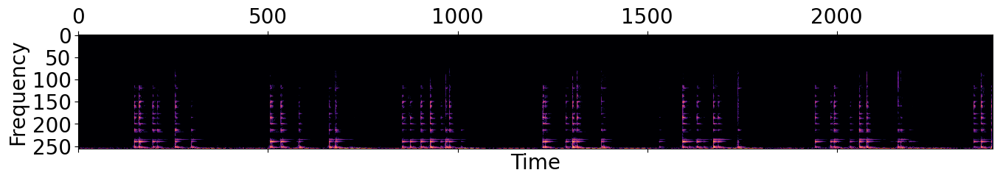

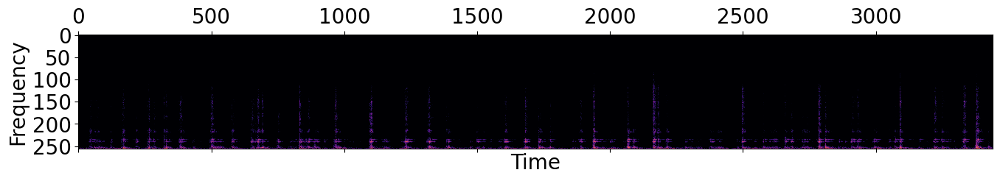

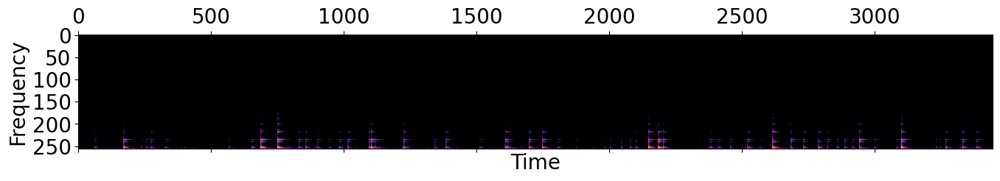

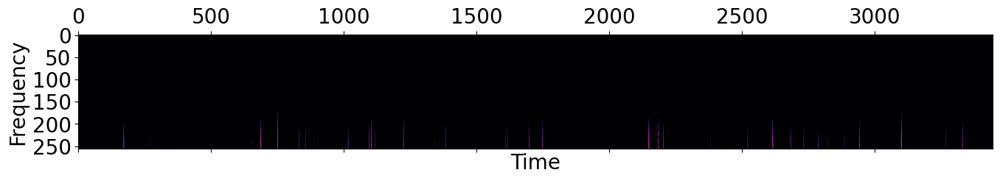

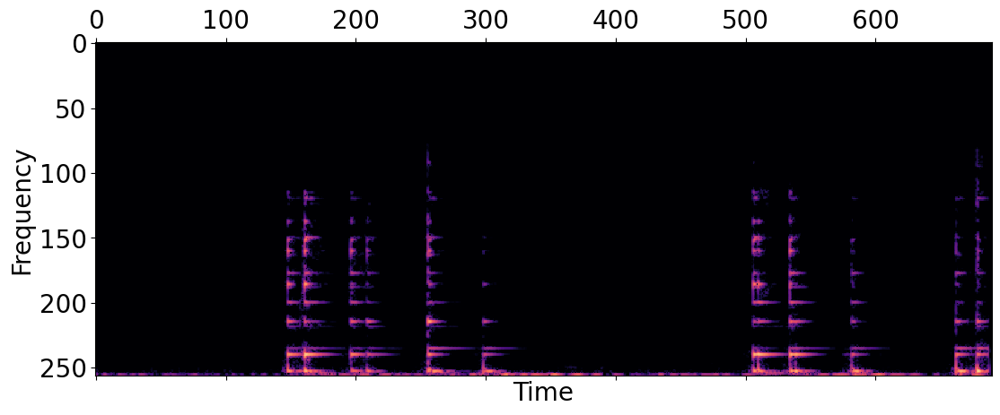

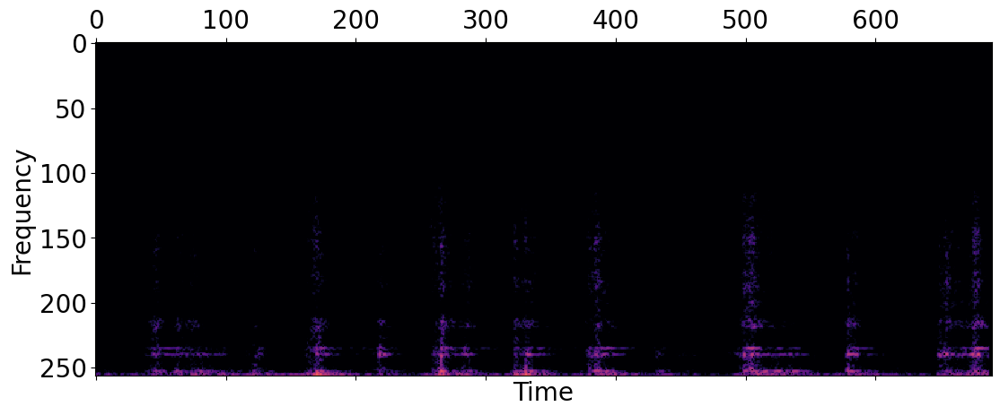

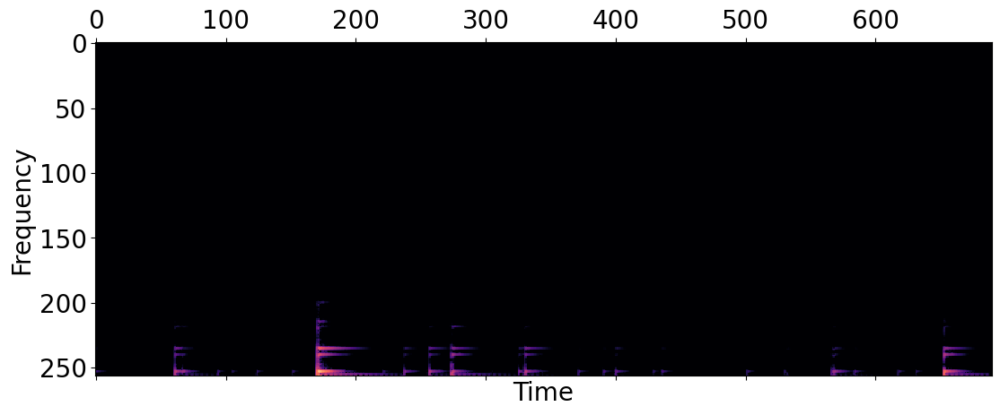

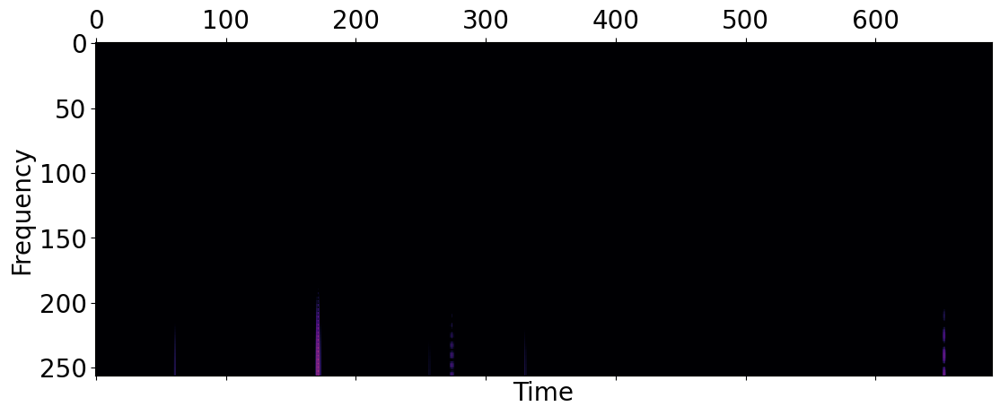

max amp intermediate spectrogram:  12.223261
predicted audio as is:  tf.Tensor(
[[-8.7711314e-08 -1.0268269e-07 -9.9744383e-08 ... -8.2006241e-05
  -8.7172244e-05 -8.9844660e-05]], shape=(1, 441000), dtype=float32)
after normalizing predicted audio: [[  0   0   0 ... -47 -50 -52]]
max amp:  32767


In [9]:
# Get audio with predicted force profile
"""
acceleration_scale = prediction['acceleration_scalar']
impulse_profile = prediction['impact']['signal']
ir = prediction['modal_fir']['signal'] # modal response
noise = prediction['filtered_noise']['signal']
revc = prediction['reverb']['controls']['ir']
"""
# material_id = 124
empty = tf.zeros([1, 1720, 80])
# test_input = tf.data.Dataset.from_tensor_slices({'audio':decoded_audio, 'material_id':[material_id], 'video_id':[0]}).batch(2)
test_empty_input = tf.data.Dataset.from_tensor_slices({'audio':empty, 'mel_spec':empty, 'material_id':[material_id], 'video_id':[0]}).batch(2)
print("input to the model: ", test_input)
# display(IPython.display.Audio(data=empty, rate=int(train_sample_rate)))
preds = model(next(iter(test_empty_input)), training=False)


# Get audio with predicted force profile components
# Path to impact components output
if audio_type == "pred":
    print("Using predicted force profile components...")
    if example_type == "val":
        impact_comp_dir = f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval_new_waveglow/impact_components/"
    elif example_type == "train":
        impact_comp_dir = f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_train_subset_eval/impact_components/"
else:
    print("Getting ground truth components...")
    impact_comp_dir = f"/juno/u/jyau/regnet/data/features/tapping/materials/{ckpt_name}/impulse_profile_components/"
#     impact_comp_dir = f"/juno/u/jyau/regnet/data/features/tapping/materials/sam-ckpts-multiclass-diffimpact-outputs/impulse_profile_components/"

print("**************************************************Impact comp dir: \n", impact_comp_dir)
# Load the predicted force profile components
mags = np.load(os.path.join(impact_comp_dir, f'{audio_title}_magnitudes.npy'))
print(mags.shape)
if len(mags.shape) < 3:
    mags = tf.expand_dims(tf.convert_to_tensor(mags), axis=0)
else:
    mags = tf.convert_to_tensor(mags)

taus = np.load(os.path.join(impact_comp_dir, f'{audio_title}_taus.npy'))
if len(taus.shape) < 3:
    taus = tf.expand_dims(tf.convert_to_tensor(taus), axis=0)
else:
    taus = tf.convert_to_tensor(taus)

stdevs = np.load(os.path.join(impact_comp_dir, f'{audio_title}_stdevs.npy'))
if len(stdevs.shape) < 3:
    stdevs = tf.expand_dims(tf.convert_to_tensor(stdevs), axis=0)
else:
    stdevs = tf.convert_to_tensor(stdevs)
    
print(f"mags shape: {mags.shape}, taus shape: {taus.shape}, stdevs shape:{stdevs.shape}")
print("num non-zeroes in pred taus: ", tf.math.count_nonzero(tf.math.round(taus)))
print("pred stdevs: ", tf.math.count_nonzero(tf.math.round(stdevs))) # only noise
print("pred magnitudes non zeros: ", tf.math.count_nonzero(tf.math.round(mags)))
print(mags)
print(taus)

impact_audio, impact_profile = generate_audio_impact(preds, modal_fir, reverb, impact, mags, taus, stdevs,
                   noise, acceleration_scale, revc, audio_sample_rate, example_secs, output_dir, scratch='raw',
                   modal_fir_only=True)
print("Impact profile: ", impact_profile)
print("pred impact profile non zeros: ", tf.math.count_nonzero(tf.math.round(impact_profile)))
print(f"impact audio shape: {audio_final.shape} compared to audio_synth shape: {prediction['audio_synth'].shape}")
display(IPython.display.Audio(data=impact_audio, rate=int(train_sample_rate)))

print("Plots of impact profile")
ddsp.colab.colab_utils.specplot(gt_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :], size=512)
# ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :], size=512)
ddsp.colab.colab_utils.specplot(impact_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(ddsp.core.resample(impact_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :], size=512)

ddsp.colab.colab_utils.specplot(gt_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(decoded_audio[:1, :train_sample_rate*2], size=512)
# ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(impact_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(ddsp.core.resample(impact_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :train_sample_rate*2], size=512)
print("Done")

# output_dir = os.path.join(save_dir, f'impact_profile_noaxis')
# os.makedirs(output_dir, exist_ok=True)
# # t2 = np.linspace(0, test_samples/train_sample_rate, test_samples * 2)
# t2 = np.linspace(0, test_samples/train_sample_rate, test_samples * sample_factor)
# plt.plot(t2, np.squeeze(impact_profile), c='red', linewidth=2)
# plt.ylabel('Amplitude')
# plt.xlabel('Time (s)')
# if no_axis:
#     ax = plt.gca()
#     # ax.axes.yaxis.set_visible(False)
# #     ax.axes.yaxis.set_ticks([])
#     plt.xticks(fontsize=font_size-6)
    
# fig = plt.gcf()
# fig.set_size_inches(fig_width+2, fig_height)
# fig.savefig(os.path.join(output_dir, audio_title+f'_{audio_type}_force_profile_impact_signal_only-material_id_{material_id}.png'), bbox_inches='tight')
plt.show()

# Find max amplitude of intermediate spectrogram
pred_max_inter_spec_amp = np.max(np.abs(spec))
print("max amp intermediate spectrogram: ", pred_max_inter_spec_amp)

# Save convolved audio
# The write function in scipy.io.wavfile expects the input array to have the shape (num_samples, num_channels)
# https://stackoverflow.com/questions/40822877/scipy-io-cant-write-wavfile
# For example shape (2, 40000) is incorrect, need transposing
print("predicted audio as is: ", impact_audio)
audio_path = f"{os.path.join(save_dir, audio_title+f'_{force_profile_model_name}_{audio_type}_convolve_impact_pred'+ str(material_id) +'.wav')}"
transposed_audio = np.transpose(impact_audio.numpy())
scipy.io.wavfile.write(audio_path, audio_sample_rate,
      np.array(32767 * transposed_audio / np.max(np.abs(impact_audio))).astype('int16'))
print("after normalizing predicted audio:", np.array(32767 * impact_audio / np.max(np.abs(impact_audio))).astype('int16'))
print("max amp: ", np.max(np.array(32767 * impact_audio / np.max(np.abs(impact_audio))).astype('int16')))

In [10]:
from scipy.signal import hilbert
def Envelope_distance(predicted_binaural, gt_binaural):
    #channel1
    pred_env_channel1 = np.abs(hilbert(predicted_binaural[0,:]))
    gt_env_channel1 = np.abs(hilbert(gt_binaural[0,:]))
    channel1_distance = np.sqrt(np.mean((gt_env_channel1 - pred_env_channel1)**2))

    #channel2
#     pred_env_channel2 = np.abs(hilbert(predicted_binaural[1,:]))
#     gt_env_channel2 = np.abs(hilbert(gt_binaural[1,:]))
#     channel2_distance = np.sqrt(np.mean((gt_env_channel2 - pred_env_channel2)**2))

    #sum the distance between two channels
    envelope_distance = channel1_distance #+ channel2_distance
    return float(envelope_distance)

In [11]:
import librosa

def STFT_L2_distance(predicted_binaural, gt_binaural):
    #channel1
    predicted_spect_channel1 = librosa.core.stft(np.asfortranarray(predicted_binaural[0,:]), n_fft=512, hop_length=160, win_length=400, center=True)
    gt_spect_channel1 = librosa.core.stft(np.asfortranarray(gt_binaural[0,:]), n_fft=512, hop_length=160, win_length=400, center=True)
    real = np.expand_dims(np.real(predicted_spect_channel1), axis=0)
    imag = np.expand_dims(np.imag(predicted_spect_channel1), axis=0)
    predicted_realimag_channel1 = np.concatenate((real, imag), axis=0)
    real = np.expand_dims(np.real(gt_spect_channel1), axis=0)
    imag = np.expand_dims(np.imag(gt_spect_channel1), axis=0)
    gt_realimag_channel1 = np.concatenate((real, imag), axis=0)
    channel1_distance = np.mean(np.power((predicted_realimag_channel1 - gt_realimag_channel1), 2))

    #channel2
#     predicted_spect_channel2 = librosa.core.stft(np.asfortranarray(predicted_binaural[1,:]), n_fft=512, hop_length=160, win_length=400, center=True)
#     gt_spect_channel2 = librosa.core.stft(np.asfortranarray(gt_binaural[1,:]), n_fft=512, hop_length=160, win_length=400, center=True)
#     real = np.expand_dims(np.real(predicted_spect_channel2), axis=0)
#     imag = np.expand_dims(np.imag(predicted_spect_channel2), axis=0)
#     predicted_realimag_channel2 = np.concatenate((real, imag), axis=0)
#     real = np.expand_dims(np.real(gt_spect_channel2), axis=0)
#     imag = np.expand_dims(np.imag(gt_spect_channel2), axis=0)
#     gt_realimag_channel2 = np.concatenate((real, imag), axis=0)
#     channel2_distance = np.mean(np.power((predicted_realimag_channel2 - gt_realimag_channel2), 2))

    #sum the distance between two channels
    stft_l2_distance = channel1_distance #+ channel2_distance
    return float(stft_l2_distance)

In [12]:
# Normalize the amplitude
# Loading and processing audio, waveglow
MAX_WAV_VALUE = 32768.0

def normalize_amp(input_audio, max_amp=32767.0, normalize=True):
    if not normalize:
        return input_audio
    
    result = np.zeros_like(input_audio)
    
    # Find the max amplitude in audio
    max_peak = np.max(np.abs(input_audio))
    ratio = max_amp / max_peak #(equivalent to 1 / (25000 / 32767.0))
    print("Max peak: ", max_peak)
    
    for i in range(input_audio.shape[0]): # iterate through the samples
        result[i,:] = np.round(input_audio[i,:] * ratio)
    return result

In [13]:
def pad_audio(audio, shape):
    result = np.zeros(shape)
    result[:audio.shape[0], :audio.shape[1]] = audio
    return result

In [14]:
# # CDPAM loss
# import torch

# NORMALIZE = True

# device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# loss_fn = cdpam.CDPAM(dev=device)

# print(audio_title)

# if example_type == "val":
#     # uses librosa loading into numpy array, and defaults to sr=22050
#     gt = cdpam.load_audio(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/{audio_title}.wav')
# else:
#     gt = cdpam.load_audio(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/train/{audio_title}.wav')
# print(train_sample_rate)

# gt_max_amp = np.max(np.abs(gt))
# print("Max amplitude in ground truth", gt_max_amp)
# # normalize ground truth
# print("Ground truth normalized")
# gt = normalize_amp(gt)
# display(IPython.display.Audio(data=gt, rate=22050))

# gt_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/mel_spec_eval_gt/{audio_title}_gt_synthesis.wav')
# wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_eval/checkpoint_009000_outputs/TrainAll/{audio_title}_synthesis.wav')
# ceramic_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_eval_ceramic/checkpoint_009000_outputs/TrainCeramicPlate/{audio_title}_synthesis.wav')

# ceramic_wave = normalize_amp(ceramic_wave, normalize=NORMALIZE)
# gt_wave = normalize_amp(gt_wave)
# wave = normalize_amp(wave)

# display(IPython.display.Audio(data=ceramic_wave, rate=22050))
# display(IPython.display.Audio(data=wave, rate=22050))

# ckpt_name = "tapping-embed-vec-len-32-no-regularizer-high-pass-multiclass-verify-last"
# save_dir = os.path.join(ckpt_path, ckpt_name)
# synth_wave = cdpam.load_audio(os.path.join(save_dir, audio_title+f'_{audio_type}_synth_from_mel_spec_'+ str(material_id) +'.wav'))
# print(synth_wave)
# synth_wave = normalize_amp(synth_wave, normalize=NORMALIZE) #,max_amp=gt_max_amp)
# print(np.max(np.abs(synth_wave)))
# display(IPython.display.Audio(data=synth_wave, rate=22050))

# # Calculate CDPAM loss
# dist = loss_fn.forward(gt, wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between gt and waveglow train all pred: ", loss)

# # Calculate CDPAM loss
# dist = loss_fn.forward(gt, ceramic_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between gt and waveglow ceramic pred: ", loss)

# # Calculate CDPAM loss
# dist = loss_fn.forward(gt, synth_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between gt and diffimpact synth material id {material_id} of pred: ", loss)

sIgkTYTWPz8-004-0040
44100
Max amplitude in ground truth 1300.0
gt shape:  (1, 221184)
Ground truth normalized
Max peak:  1300.0


waveglow audio shape:  (1, 220160)
Waveglow specific ceramic, steel, glass, wood, silicone normalized
Max peak:  349.0
Max peak:  403.0
Max peak:  1308.0
Max peak:  474.0
Max peak:  426.0
Max peak:  160.0


Waveglow train all gt, pred spectrogram, and intermediate spectorgram normalized
Max peak:  32767.0
Max peak:  441.0
Max peak:  381.0
Max peak:  450.0


Force profile convolved and DiffImpact synth normalized
Max peak:  32768.0
Max peak:  30532.0


/juno/u/jyau/anaconda3/envs/diffimpactenv/lib/python3.8/site-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


exception:  [Errno 2] No such file or directory: '/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/checkpoints/ceramic-plate/sIgkTYTWPz8-004-0040_pred_pred_reg_waveglow_all_audio_input_synth_0.wav'
Audio to play is pred...
audio shape:  tf.Tensor([], shape=(0,), dtype=int32)
decoded audio first shape:  (440320, 1)
(1, 440320)
Plots of impact profile


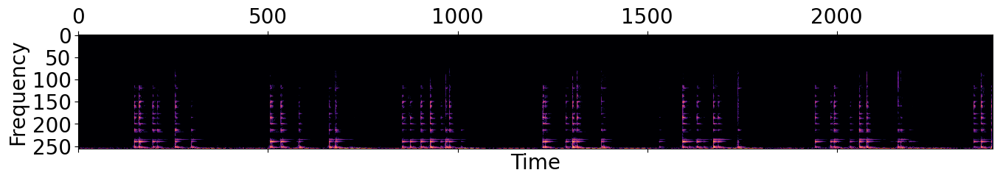

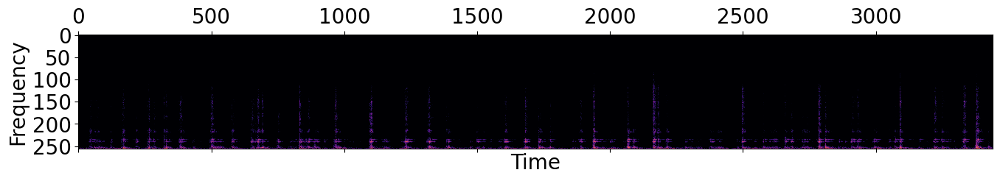

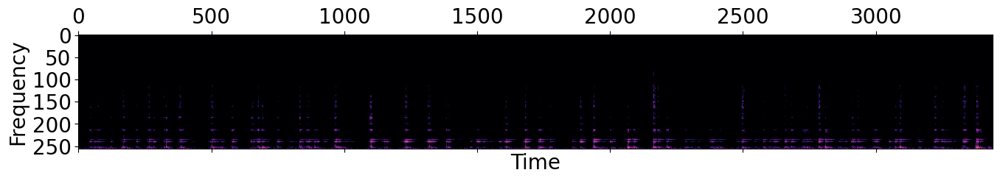

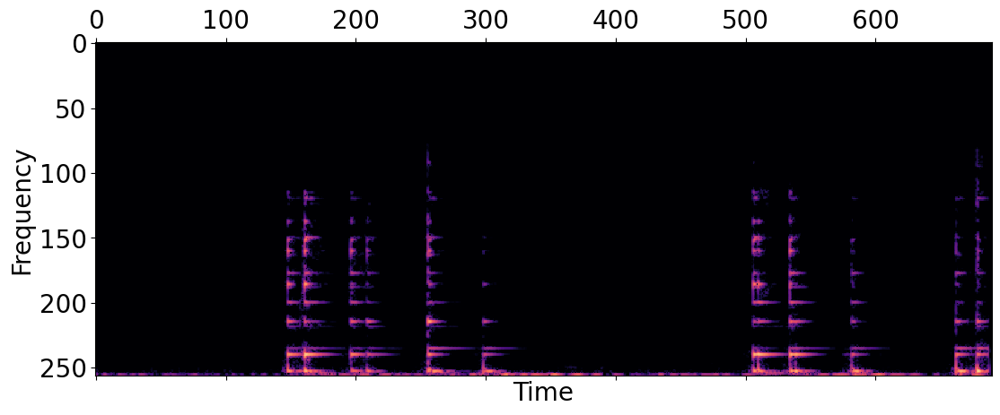

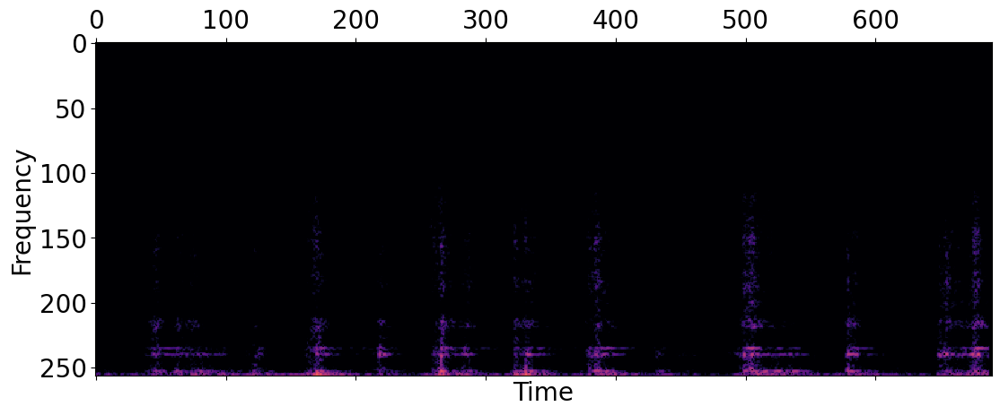

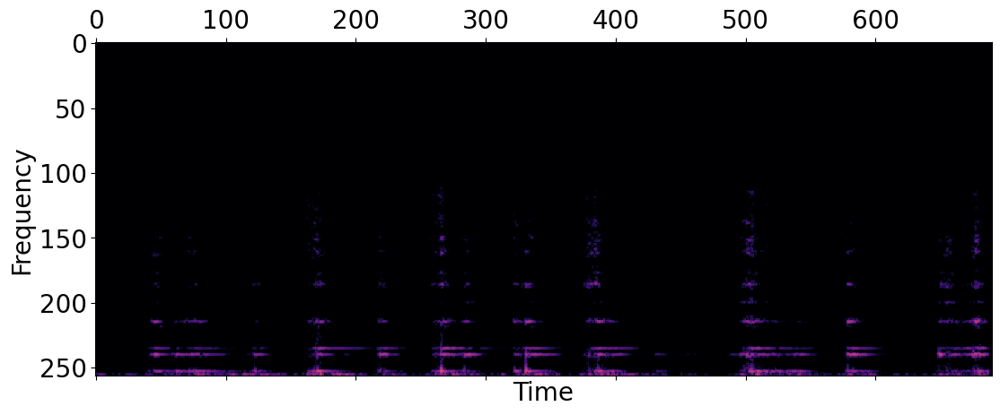

Done
CDPAM loss between waveglow train all gt and waveglow train all pred:  [0.720099]
CDPAM loss between waveglow train all gt and diffimpact convolve material id 3 of pred:  [0.45652905]
CDPAM loss between waveglow train all gt and intermediate pred spectrogram:  [0.73180234]
CDPAM loss between diffimpact convolve material id 3 of pred and intermediate pred sectrogram:  [1.0626588]
CDPAM loss between gt and waveglow train all pred:  [0.78461426]
CDPAM loss between gt and waveglow ceramic pred:  [0.8695285]
CDPAM loss between gt and waveglow steel pred:  [0.88597786]
CDPAM loss between gt and waveglow glass pred:  [0.5844806]
CDPAM loss between gt and waveglow wood pred:  [0.81352615]
CDPAM loss between gt and waveglow silicone pred:  [0.740939]
CDPAM loss between gt and force profile convolve material id 3 of pred:  [0.40380552]
CDPAM loss between gt and diffimpact synth material id 3 of pred:  [0.38644132]
CDPAM loss between gt and intermediate pred spectrogram trainall:  [0.7770134

In [17]:
# CDPAM loss
import torch

NORMALIZE = True

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
loss_fn = cdpam.CDPAM(dev=device)

print(audio_title)

# True ground truth, original audio from the video
# gt = cdpam.load_audio(f'/juno/u/jyau/regnet/data/features/tapping/materials/audio_10s_44100hz/{audio_title}.wav')
if example_type == "val":
    # uses librosa loading into numpy array, and defaults to sr=22050
    gt = cdpam.load_audio(f"/juno/u/jyau/regnet/data/features/tapping/materials/audio_10s/{audio_title}.wav")
#     gt = cdpam.load_audio(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/valid/{audio_title}.wav')
#     gt = cdpam.load_audio(f'/juno/u/jyau/regnet/data/features/carlota_videos/audio_10s/{audio_title}.wav')
else:
    gt = cdpam.load_audio(f'/juno/u/jyau/asmr-video-to-sound/data/asmr_all/high_pass/train/{audio_title}.wav')
print(train_sample_rate)

gt_max_amp = np.max(np.abs(gt))
print("Max amplitude in ground truth", gt_max_amp)
print("gt shape: ", gt.shape)
# normalize ground truth
print("Ground truth normalized")
gt = normalize_amp(gt[:, :220500])
display(IPython.display.Audio(data=gt, rate=22050))

 # Load ground truth audio spec waveform
if example_type == "val":
    gt_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_new_waveglow/{regnet_model_ckpt}/WaveGlowWeights/{audio_title}_gt_synthesis.wav')
#     ceramic_gt_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_eval_ceramic/checkpoint_009000_outputs/TrainCeramicPlate/{audio_title}_gt_synthesis.wav')
#     steel_gt_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_eval_glass/checkpoint_009000_outputs/TrainSteel/{audio_title}_gt_synthesis.wav')
    
    # Load predicted spec waveform
    wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/{regnet_eval_dir}/{regnet_model_ckpt}/{regnet_vocoder}/{audio_title}_synthesis.wav')
    ceramic_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_ceramic/{regnet_model_ckpt}/TrainCeramicPlate/{audio_title}_synthesis.wav')
    steel_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_steel/{regnet_model_ckpt}/TrainSteel/{audio_title}_synthesis.wav')
    glass_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_glass/{regnet_model_ckpt}/TrainGlassBowl/{audio_title}_synthesis.wav')
    wood_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_wood/{regnet_model_ckpt}/TrainWoodenBox/{audio_title}_synthesis.wav')
    silicone_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/last_ckpt_eval_silicone/{regnet_model_ckpt}/TrainSilicone/{audio_title}_synthesis.wav')
    
    # Intermediate spectrogram through waveglow all
    inter = cdpam.load_audio(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval/checkpoint_018000_outputs/TrainAll/{audio_title}_synthesis.wav")
    inter_ceramic = cdpam.load_audio(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval_ceramic/checkpoint_018000_outputs/TrainCeramicPlate/{audio_title}_synthesis.wav")
    
    print("waveglow audio shape: ", wave.shape)
    
    # If Waveglow outputs aren't exactly 220500
    gt_wave = pad_audio(gt_wave, (1, 220500))  
    ceramic_wave = pad_audio(ceramic_wave, (1, 220500))
    steel_wave = pad_audio(steel_wave, (1, 220500))
    glass_wave = pad_audio(glass_wave, (1, 220500))
    wood_wave = pad_audio(wood_wave, (1, 220500))    
    silicone_wave = pad_audio(silicone_wave, (1, 220500))
    inter_ceramic = pad_audio(inter_ceramic, (1, 220500))
    
    # normalize waveglow specfics
    print("Waveglow specific ceramic, steel, glass, wood, silicone normalized")
#     ceramic_gt_wave = normalize_amp(ceramic_gt_wave)
#     steel_gt_wave = normalize_amp(steel_gt_wave)
    ceramic_wave = normalize_amp(ceramic_wave, normalize=NORMALIZE)
    steel_wave = normalize_amp(steel_wave, normalize=NORMALIZE)
    gt_wave = normalize_amp(gt_wave)
    glass_wave = normalize_amp(glass_wave)
    wood_wave = normalize_amp(wood_wave)
    silicone_wave = normalize_amp(silicone_wave)
    
#     display(IPython.display.Audio(data=ceramic_gt_wave, rate=22050))
#     display(IPython.display.Audio(data=steel_gt_wave, rate=22050))
    display(IPython.display.Audio(data=ceramic_wave, rate=22050))
    display(IPython.display.Audio(data=steel_wave, rate=22050))
    display(IPython.display.Audio(data=glass_wave, rate=22050))
    display(IPython.display.Audio(data=wood_wave, rate=22050))
    display(IPython.display.Audio(data=silicone_wave, rate=22050))

else:
#     gt_wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_five_subset_orig/last_ckpt_train_subset_eval/checkpoint_009000_outputs/TrainAll/{audio_title}_gt_synthesis.wav')
    wave = cdpam.load_audio(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/{regnet_eval_dir}/{regnet_model_ckpt}/{regnet_vocoder}/{audio_title}_synthesis.wav')
    
    # Intermediate spectrogram through waveglow all
    inter = cdpam.load_audio(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_checkpoint_train_subset_eval/checkpoint_018000_outputs/TrainAll/{audio_title}_synthesis.wav")

# normalize gt_wave, wave, inter
print("Waveglow train all gt, pred spectrogram, and intermediate spectorgram normalized")
wave = pad_audio(wave, (1, 220500))
inter = pad_audio(inter, (1, 220500))

gt_wave = normalize_amp(gt_wave)
wave = normalize_amp(wave)
inter = normalize_amp(inter)
inter_ceramic = normalize_amp(inter_ceramic)

display(IPython.display.Audio(data=gt_wave, rate=22050))
display(IPython.display.Audio(data=wave, rate=22050))
display(IPython.display.Audio(data=inter, rate=22050))

# DiffImpact waveform
print("Force profile convolved and DiffImpact synth normalized")
diff_wave = cdpam.load_audio(f"{os.path.join(save_dir, audio_title+f'_{force_profile_model_name}_{audio_type}_convolve_impact_pred'+ str(material_id)+'.wav')}")
synth_wave = cdpam.load_audio(os.path.join(save_dir, audio_title+f'_{audio_type}_synth_from_mel_spec_'+ str(material_id) +'.wav'))

# normalize diffimpact waveforms
diff_wave = normalize_amp(diff_wave) #,max_amp=gt_max_amp)
synth_wave = normalize_amp(synth_wave) #,max_amp=gt_max_amp)

display(IPython.display.Audio(data=diff_wave, rate=22050))
display(IPython.display.Audio(data=synth_wave, rate=22050))

# Regnet + waveglow + original diffimpact (Sam's checkpoints)
# save_dir = f'/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/checkpoints/{voc_type}' # Sam's checkpoint
single_ckpt = f"/juno/u/jyau/asmr-video-to-sound/ddsp/diffimpact/checkpoints/{voc_type}/"
#audio_title+f'_{audio_type}_audio_input_synth_'+ str(material_id) +'.wav'
try:
    reg_wave_orig_diff = cdpam.load_audio(os.path.join(single_ckpt, audio_title+f'_{audio_type}_pred_reg_waveglow_all_audio_input_synth_'+ str(0) +'.wav'))
    reg_wave_orig_diff = normalize_amp(reg_wave_orig_diff) #,max_amp=gt_max_amp)
    display(IPython.display.Audio(data=reg_wave_orig_diff, rate=22050))
except Exception as e:
    print("exception: ", e)

if audio_type == "pred":
    print("Audio to play is pred...")
    if example_type == "train":
        inter_audio = tf.io.read_file(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval_new_waveglow/checkpoint_018000_outputs/WaveGlowWeights/{audio_title}_synthesis.wav")
#         audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_medium_batch/train_subset_last_ckpt_inf/checkpoint_100000_outputs/TrainAll/{audio_title}_synthesis.wav')
    else:
        inter_audio = tf.io.read_file(f"/juno/u/jyau/asmr-video-to-sound/ckpt/{force_profile_model_name}/last_ckpt_eval_new_waveglow/checkpoint_018000_outputs/WaveGlowWeights/{audio_title}_synthesis.wav")
#         audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/regnet_tapping_materials_medium_batch/val_last_ckpt_inference/checkpoint_100000_outputs/TrainAll/{audio_title}_synthesis.wav')
print("audio shape: ", tf.shape(inter_audio))
inter_audio_init, audio_sample_rate = tf.audio.decode_wav(inter_audio, desired_channels=1)
print("decoded audio first shape: ", inter_audio_init.shape)

#decoded_audio = decoded_audio * # Test by inputting zero vector audio
inter_wave = tf.expand_dims(tf.squeeze(inter_audio_init[offset_samples:(offset_samples + test_samples)]), axis=0)
#decoded_audio = tf.expand_dims(tf.squeeze(decoded_audio), axis=0)
print(inter_wave.shape)

# Regnet's prediction
wave_audio = tf.io.read_file(f'/juno/u/jyau/regnet/ckpt/{regnet_model}/{regnet_eval_dir}/{regnet_model_ckpt}/{regnet_vocoder}/{audio_title}_synthesis.wav')
wave_audio_init, _ = tf.audio.decode_wav(wave_audio, desired_channels=1)
wave_wave = tf.expand_dims(tf.squeeze(wave_audio_init[offset_samples:(offset_samples + test_samples)]), axis=0)

# Plots
print("Plots of impact profile")
ddsp.colab.colab_utils.specplot(gt_audio[:1, :], size=512)
ddsp.colab.colab_utils.specplot(wave_wave[:1, :], size=512)
ddsp.colab.colab_utils.specplot(inter_wave[:1, :], size=512)
# ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :], size=512)
# ddsp.colab.colab_utils.specplot(impact_audio[:1, :], size=512)
# ddsp.colab.colab_utils.specplot(ddsp.core.resample(impact_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :], size=512)

ddsp.colab.colab_utils.specplot(gt_audio[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(wave_wave[:1, :train_sample_rate*2], size=512)
ddsp.colab.colab_utils.specplot(inter_wave[:1, :train_sample_rate*2], size=512)
# ddsp.colab.colab_utils.specplot(prediction['audio_synth'][:1, :train_sample_rate*2], size=512)
# ddsp.colab.colab_utils.specplot(impact_audio[:1, :train_sample_rate*2], size=512)
# ddsp.colab.colab_utils.specplot(ddsp.core.resample(impact_profile, int(audio_sample_rate)*example_secs, 'linear')[:1, :train_sample_rate*2], size=512)
plt.show()
print("Done")

# Calculate CDPAM loss
dist = loss_fn.forward(gt_wave, wave)
loss = dist.cpu().detach().numpy()
print("CDPAM loss between waveglow train all gt and waveglow train all pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt_wave, diff_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between waveglow train all gt and diffimpact convolve material id {material_id} of pred: ", loss)

dist = loss_fn.forward(gt_wave, inter)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between waveglow train all gt and intermediate pred spectrogram: ", loss)

dist = loss_fn.forward(diff_wave, inter)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between diffimpact convolve material id {material_id} of pred and intermediate pred sectrogram: ", loss)

# Calculate CDPAM loss
# dist = loss_fn.forward(ceramic_gt_wave, ceramic_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between waveglow ceramic gt and waveglow ceramic pred: ", loss)

# Calculate CDPAM loss
# dist = loss_fn.forward(ceramic_gt_wave, diff_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between waveglow ceramic gt and diffimpact convolve material id {material_id} of pred: ", loss)

# Calculate CDPAM loss
# dist = loss_fn.forward(ceramic_gt_wave, synth_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between waveglow ceramic gt and diffimpact synth material id {material_id} of pred: ", loss)

# Calculate CDPAM loss
# dist = loss_fn.forward(steel_gt_wave, diff_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between waveglow steel gt and diffimpact convolve material id {material_id} of pred: ", loss)

# Calculate CDPAM loss
# dist = loss_fn.forward(steel_gt_wave, synth_wave)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between waveglow steel gt and diffimpact synth material id {material_id} of pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow train all pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, ceramic_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow ceramic pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, steel_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow steel pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, glass_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow glass pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, wood_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow wood pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, silicone_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and waveglow silicone pred: ", loss)



# Calculate CDPAM loss
dist = loss_fn.forward(gt, diff_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and force profile convolve material id {material_id} of pred: ", loss)

# Calculate CDPAM loss
dist = loss_fn.forward(gt, synth_wave)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and diffimpact synth material id {material_id} of pred: ", loss)

dist = loss_fn.forward(gt, inter)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and intermediate pred spectrogram trainall: ", loss)

dist = loss_fn.forward(gt, inter_ceramic)
loss = dist.cpu().detach().numpy()
print(f"CDPAM loss between gt and intermediate pred spectrogram ceramic: ", loss)


# dist = loss_fn.forward(gt, reg_wave_orig_diff)
# loss = dist.cpu().detach().numpy()
# print(f"CDPAM loss between gt and regnet + waveglow trainall + original/Sam diffimpact: ", loss)

print("gt size: ", gt.shape)
print("diff wave size: ", diff_wave.shape)
print("wave size: ", wave.shape)

# L2 loss (mean squared loss) comparison
l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, diff_wave)))
l2norm = tf.norm(gt - diff_wave)
print(f"L2 loss between gt and force profile convolve material id {material_id} of pred: {l2loss} also {l2norm}")

# L1 loss comparison
l1loss = tf.reduce_sum(tf.math.abs(gt - diff_wave))
l1norm = tf.norm(gt - diff_wave, ord=1)
print(f"L1 loss between gt and force profile convolve material id {material_id} of pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(diff_wave, gt)
print(f"Envelope distance between gt and force profile convolve material id {material_id} of pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(diff_wave, gt)
print(f"STFT L2 distance between gt and force profile convolve material id {material_id} of pred: {stft_l2}")


# L2 loss (mean squared loss) comparison
l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, synth_wave)))
l2norm = tf.norm(gt - synth_wave)
print(f"L2 loss between gt and diffimpact synth wave {material_id} of pred: {l2loss} and {l2norm}")

# L1 loss comparison
l1loss = tf.reduce_sum(tf.math.abs(gt - synth_wave))
l1norm = tf.norm(gt - synth_wave, ord=1)
print(f"L1 loss between gt and diffimpact synth material id {material_id} of pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(synth_wave, gt)
print(f"Envelope distance between gt and diffimpact synth material id {material_id} of pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(synth_wave, gt)
print(f"STFT L2 distance between gt and diffimpact synth material id {material_id} of pred: {stft_l2}")


l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, wave)))
l2norm = tf.norm(gt - wave)
print(f"L2 loss between gt and regnet waveglow trainall pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - wave))
l1norm = tf.norm(gt - wave, ord=1)
print(f"L1 loss between gt and regnet waveglow trainall pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(wave, gt)
print(f"Envelope distance between gt and regnet waveglow trainall pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow trainall pred: {stft_l2}")

print("**********waveglow specific************")

l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, ceramic_wave)))
l2norm = tf.norm(gt - ceramic_wave)
print(f"L2 loss between gt and regnet waveglow ceramic pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - ceramic_wave))
l1norm = tf.norm(gt - ceramic_wave, ord=1)
print(f"L1 loss between gt and regnet waveglow ceramic pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(ceramic_wave, gt)
print(f"Envelope distance between gt and regnet waveglow ceramic pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(ceramic_wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow ceramic pred: {stft_l2}")


l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, wood_wave)))
l2norm = tf.norm(gt - wood_wave)
print(f"L2 loss between gt and regnet waveglow wood pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - wood_wave))
l1norm = tf.norm(gt - wood_wave, ord=1)
print(f"L1 loss between gt and regnet waveglow wood pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(wood_wave, gt)
print(f"Envelope distance between gt and regnet waveglow wood pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(wood_wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow wood pred: {stft_l2}")

l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, glass_wave)))
l2norm = tf.norm(gt - glass_wave)
print(f"L2 loss between gt and regnet waveglow glass pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - glass_wave))
l1norm = tf.norm(gt - glass_wave, ord=1)
print(f"L1 loss between gt and regnet waveglow glass pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(glass_wave, gt)
print(f"Envelope distance between gt and regnet waveglow glass pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(glass_wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow glass pred: {stft_l2}")



l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, steel_wave)))
l2norm = tf.norm(gt - steel_wave)
print(f"L2 loss between gt and regnet waveglow steel pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - steel_wave))
l1norm = tf.norm(gt - steel_wave, ord=1)
print(f"L1 loss between gt and regnet waveglow steel pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(steel_wave, gt)
print(f"Envelope distance between gt and regnet waveglow steel pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(steel_wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow steel pred: {stft_l2}")



l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, silicone_wave)))
l2norm = tf.norm(gt - silicone_wave)
print(f"L2 loss between gt and regnet waveglow silicone pred: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - silicone_wave))
l1norm = tf.norm(gt - silicone_wave, ord=1)
print(f"L1 loss between gt and regnet waveglow silicone pred: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(silicone_wave, gt)
print(f"Envelope distance between gt and regnet waveglow silicone pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(silicone_wave, gt)
print(f"STFT L2 distance between gt and regnet waveglow silicone pred: {stft_l2}")

print("===============Intermediate spectrogram metrics==============================")


l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, inter)))
l2norm = tf.norm(gt - inter)
print(f"L2 loss between gt and inter spectrogram trainall: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - inter))
l1norm = tf.norm(gt - inter, ord=1)
print(f"L1 loss between gt and inter spectrogram waveglow trainall: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(inter, gt)
print(f"Envelope distance between gt and inter waveglow trainall pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(inter, gt)
print(f"STFT L2 distance between gt and inter waveglow trainall pred: {stft_l2}")



l2loss = tf.math.sqrt(tf.reduce_sum(tf.math.squared_difference(gt, inter_ceramic)))
l2norm = tf.norm(gt - inter_ceramic)
print(f"L2 loss between gt and inter spectrogram waveglow ceramic: {l2loss} and {l2norm}")

l1loss = tf.reduce_sum(tf.math.abs(gt - inter_ceramic))
l1norm = tf.norm(gt - inter_ceramic, ord=1)
print(f"L1 loss between gt and inter spectrogram waveglow ceramic: {l1loss} and {l1norm}")

# Envelope distance
env = Envelope_distance(inter_ceramic, gt)
print(f"Envelope distance between gt and inter waveglow ceramic pred: {env}")

# STFT L2 distance
stft_l2 = STFT_L2_distance(inter_ceramic, gt)
print(f"STFT L2 distance between gt and inter waveglow ceramic pred: {stft_l2}")


In [ ]:
# Get modal response with the audio dspy library
# import audio_dspy as adsp
# mel = np.load(f'/juno/u/jyau/regnet/data/features/ASMR/orig_asmr_by_material_clips/melspec_10s_44100hz/{vid}_mel.npy')
# print(f'mel shape: {mel.shape} and audio sample rate: {audio_sample_rate}')
# freqs, gains = adsp.find_freqs(decoded_audio_init, audio_sample_rate, plot=True)

# obj = {}
# obj['frequencies'] = freqs
# obj['gains'] = gains
# obj['dampings'] = prediction['dampings']

# # Generate modal response, and convolve with the force profile, noise, and reverb
# print(f"freqs: {freqs.shape}, gains: {gains.shape}, damping: {prediction['dampings'].shape} noise: {noise.shape}, revc: {revc.shape}")
# audio_final = generate_audio(obj, modal_fir, reverb, impulse_profile,
#                              prediction['modal_fir']['controls']['gains'],
#                              prediction['modal_fir']['controls']['frequencies'],
#                              prediction['modal_fir']['controls']['dampings'],
#                              ir, noise, acceleration_scale, revc, audio_sample_rate, example_secs, scratch='raw')
# print(f"final audio shape: {audio_final.shape} compared to audio_synth shape: {prediction['audio_synth'].shape}")
# display(IPython.display.Audio(data=audio_final, rate=int(train_sample_rate)))

In [ ]:
# scratch = 'else'
# # Generate modal FIR --> modal response (object material sound)
# modal_response = prediction['modal_fir']['signal']
# irc_scratch = modal_fir.get_controls(prediction['gains'], prediction['frequencies'], prediction['dampings'])
# ir_scratch = modal_fir.get_signal(irc_scratch['gains'], irc_scratch['frequencies'], irc_scratch['dampings'])
# #ir = modal_fir.get_signal(irc['gains'], irc['frequencies'], irc['dampings'])# Modal response
# ir = modal_fir.get_signal(prediction['modal_fir']['controls']['gains'],
#                           prediction['modal_fir']['controls']['frequencies'],
#                           prediction['modal_fir']['controls']['dampings'])
# print("ir: ", ir)
# print("model's output modal response: ", modal_response)
# print("ir_scratch: ", ir_scratch)
# # Convolve together for modal vibration sounds
# # Convolve together for modal vibration sounds
# if scratch == 'raw':
#     audio = ddsp.core.fft_convolve(impulse_profile, ir_scratch)
# elif scratch == 'controls':
#     audio = ddsp.core.fft_convolve(impulse_profile, ir)
# else:
#     audio = ddsp.core.fft_convolve(impulse_profile, modal_response)
# print("convolved shape: ", audio.shape)

# # Generate and add time constant noise
# audio += noise
# print("after adding noise: ", audio.shape)

# # Add acceleration sound
# audio += impulse_profile * acceleration_scale
# print("after acceleration sound: ", audio.shape)

# # Add reverb
# audio = reverb.get_signal(audio, revc)#revc['ir'])
# print("after reverb: ", audio.shape)

# # Downsample from internal sampling rate to original recording sampling rate
# print("audio sample rate: ", audio_sample_rate)
# audio = ddsp.core.resample(audio, int(audio_sample_rate)*example_secs, 'linear')
# display(IPython.display.Audio(data=audio, rate=int(train_sample_rate)))

In [ ]:
# TODO: only after merging the regnet and ddsp models, otherwise they're using two different envs currently
# Load the trained frequency decoder model
# model = Modal_Response_Net()
# print("Initialized model")

# model.load_checkpoint(config.checkpoint_path)

# # Load data
# print("Getting the images to be stacked...")
# args.test_list = './filelists/asmr_by_material_1hr_train.txt' 
# trainset = get_TSN_Data_set(args)
# args.test_list = './filelists/asmr_by_material_1hr_test.txt'
# valset = get_TSN_Data_set(args)

# train_loader = DataLoader(trainset, num_workers=0, shuffle=True,
#                           batch_size=config.batch_size, pin_memory=False,
#                           drop_last=True)
# test_loader = DataLoader(valset, num_workers=0, shuffle=False,
#                          batch_size=config.batch_size, pin_memory=False)
# print("Check number of train examples: ", len(trainset))
# print("Check number of train loader examples: ", len(train_loader))
# assert(len(trainset) > 0)
# assert(len(train_loader) > 0)

In [ ]:
# SpecGAN Vladimir evaluated sample check
# mel_check = np.load('/juno/u/jyau/SpecVQGAN/logs/2021-12-11T17-05-22_asmr_by_material_transformer/samples_None/VAS_validation/cls_1/ASMR_Addictive_Tapping_1_Hr_No_Talking-ceramic-plate-38-of-41_mel_sample_0.npy')
# print(mel_check.shape)
# ddsp.colab.colab_utils.specplot(mel_check, size=512)

# plt.figure()
# plt.imshow(mel_check,aspect='auto', origin='lower')
# plt.show()
#display(IPython.display.Audio(data=check, rate=int(44100)))